In [1]:
import pandas as pd

## 1. Read Metadata

In [2]:
meta_data = pd.read_csv('../../../For_analysis/RNASequencing/IR3/metaDataIR3.csv')
meta_data

,HudAlphaID,QCflagIR3,Specimen Bar Code,PATNO,GENDER,DIAGNOSIS,CLINICAL_EVENT,Specimen Bar Code.1,Quantity (ug),Concentration (ng/ul),...,MEDIAN_3PRIME_BIAS,NUM_UNEXPLAINED_READS,PCT_RIBOSOMAL_BASES,PCT_INTRONIC_BASES,PCT_R2_TRANSCRIPT_STRAND_READS,PCT_MRNA_BASES,MEDIAN_5PRIME_TO_3PRIME_BIAS,PCT_R1_TRANSCRIPT_STRAND_READS,MEDIAN_5PRIME_BIAS,PCT_USABLE_BASES
0,5104-SL-0001,pass,0000373111,3174,Male,PD,V08,0000373111,1.0,115.90,...,0.845235,1093161,0.0,43.4564,98.1025,50.4726,1.191875,1.8975,1.019442,47.9359
1,5104-SL-0002,pass,PP0016-0526,3201,Female,Control,BL,PP0016-0526,1.0,80.07,...,0.913436,569224,0.0,52.9752,98.1428,40.6987,1.058616,1.8572,0.965040,39.6130
2,5104-SL-0003,pass,0003125874,3057,Female,Control,V06,0003125874,1.0,219.70,...,0.902573,485102,0.0,52.2706,95.4321,36.0884,1.095971,4.5679,0.997003,34.8096
3,5104-SL-0004,pass,0003179818,4126,Male,PD,V04,0003179818,1.0,100.06,...,0.856690,1145227,0.0,45.9355,98.3785,48.3407,1.170152,1.6215,1.013765,45.3119
4,5104-SL-0005,pass,0003164601,4117,Female,PD,BL,0003164601,1.0,124.40,...,0.894656,461631,0.0,58.3984,98.0678,35.8255,1.113733,1.9322,0.985280,34.8793
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4866,5104-SL-4890,pass,0003314545,41314,Female,Genetic Cohort,V02,0003314545,1.0,105.10,...,0.707867,1097837,0.0,41.6055,92.5357,40.2167,1.526826,7.4643,1.086717,36.7253
4867,5104-SL-4891,pass,0003376702,42308,Male,Genetic Cohort,V02,0003376702,1.0,56.09,...,0.719713,775420,0.0,47.0490,97.3024,38.8043,1.269003,2.6976,0.946045,35.5802
4868,5104-SL-4892,pass,0003376763,42306,Male,Genetic Cohort,V02,0003376763,1.0,59.68,...,0.736184,794163,0.0,49.0178,97.0378,38.4877,1.300012,2.9622,0.995326,35.4419
4869,5104-SL-4893,pass,0003203630,1010,Unk,HCPOOL,Unk,0003203630,1.0,50.00,...,0.707379,748803,0.0,40.0865,95.8621,44.4177,1.479038,4.1379,1.031890,41.3555


In [3]:
meta_data.columns

Index(['HudAlphaID', 'QCflagIR3', 'Specimen Bar Code', 'PATNO', 'GENDER',
       'DIAGNOSIS', 'CLINICAL_EVENT', 'Specimen Bar Code.1', 'Quantity (ug)',
       'Concentration (ng/ul)', 'Concentration Flag', 'Submitted Volume (ul)',
       'Normalization Volume (30ng/ul)', 'Total Volume (ul)',
       'Input RNASeq (ng)', 'Input miRNA (ng)', '260/280 Ratio',
       '260/230 Ratio', 'RIN Value', 'BOX', 'POSITION', 'Plate', 'Sample',
       'deletion_length', 'insertion_length', 'mismatch_rate',
       'multimapped_percent', 'uniquely_mapped_percent',
       'num_annotated_splices', 'insertion_rate', 'unmapped_other_percent',
       'multimapped', 'num_splices', 'avg_input_read_length',
       'multimapped_toomany', 'total_reads', 'num_GCAG_splices',
       'unmapped_tooshort', 'unmapped_other', 'unmapped_mismatches_percent',
       'num_noncanonical_splices', 'num_ATAC_splices',
       'multimapped_toomany_percent', 'avg_mapped_read_length',
       'unmapped_mismatches', 'deletion_rate', '

In [4]:
meta_data.PATNO.value_counts()

PATNO
1010     53
1009     53
4104      5
3229      5
3214      5
         ..
42349     1
42298     1
42305     1
42431     1
42312     1
Name: count, Length: 1603, dtype: int64

In [5]:
disease_df = meta_data[['PATNO','DIAGNOSIS']].drop_duplicates()

In [6]:
disease_df.DIAGNOSIS.value_counts()

DIAGNOSIS
Genetic Registry    435
PD                  425
Genetic Cohort      418
Control             196
Prodromal            64
SWEDD                63
PDPOOL                1
HCPOOL                1
Name: count, dtype: int64

In [7]:
import os

In [8]:
l = 0
for i in os.listdir('../../../For_analysis/RNASequencing/IR3/quant/'):
    l = l + 1
    print(i)
    if l==3:
        break

PPMI-Phase2-IR3.3813.V02.PP0013-6148.5104-SL-4635.longRNA-NEBKAP.salmon.genes.sf
PPMI-Phase2-IR3.3481.BL.0003119333.5104-SL-0197.longRNA-NEBKAP.salmon.genes.sf
PPMI-Phase1-IR3.18567.BL.0000302585.5104-SL-1516.longRNA-NEBKAP.salmon.genes.sf


## 2. Read Gene list (Smaller)

In [9]:
gene_excel = pd.ExcelFile('/12tb_dsk3/For_analysis/PD genes.xlsx')
df2 = pd.read_excel(gene_excel, 'Gene_List_Lancet')


In [10]:
df2

,Nearest Gene
0,ASXL3
1,BAG3
2,BIN3
3,BRIP1
4,BST1
...,...
85,UBAP2
86,UBTF
87,VAMP4
88,VPS13C


In [11]:
gene_list = df2['Nearest Gene'].tolist()

In [12]:
import numpy as np
for i in range(100):
    try:
        gene_list.remove(np.nan) # run 4 times
    except:
        break

In [13]:
gene_list = [i.strip() for i in gene_list]

In [14]:
gene_list

['ASXL3',
 'BAG3',
 'BIN3',
 'BRIP1',
 'BST1',
 'C5orf24',
 'CAB39L',
 'CAMK2D',
 'CASC16',
 'CD19',
 'CHD9',
 'CHRNB1',
 'CLCN3',
 'CRHR1',
 'CRHR1',
 'CRLS1',
 'CTSB',
 'DLG2',
 'DNAH17',
 'DYRK1A',
 'ELOVL7',
 'FAM171A2',
 'FAM47E',
 'FAM47E-STBD1',
 'FAM49B',
 'FBRSL1',
 'FCGR2A',
 'FGF20',
 'FYN',
 'GAK',
 'GALC',
 'GBAP1',
 'GBF1',
 'GCH1',
 'GPNMB',
 'GS1-124K5.11',
 'HIP1R',
 'HLA-DRB5',
 'IGSF9B',
 'INPP5F',
 'IP6K2',
 'ITGA8',
 'ITPKB',
 'KCNIP3',
 'KCNS3',
 'KPNA1',
 'KRTCAP2',
 'LCORL',
 'LINC00693',
 'LOC100131289',
 'LRRK2',
 'LRRK2',
 'MAP4K4',
 'MBNL2',
 'MCCC1',
 'MED12L',
 'MEX3C',
 'MIPOL1',
 'NOD2',
 'NUCKS1',
 'PAM',
 'PMVK',
 'RAB29',
 'RETREG3',
 'RIMS1',
 'RIT2',
 'RNF141',
 'RPS12',
 'RPS6KL1',
 'SATB1',
 'SCAF11',
 'SCARB2',
 'SETD1A',
 'SH3GL2',
 'SH3GL2',
 'SIPA1L2',
 'SNCA',
 'SNCA',
 'SPPL2B',
 'SPTSSB',
 'STK39',
 'SYT17',
 'TMEM163',
 'TMEM175',
 'TRIM40',
 'UBAP2',
 'UBTF',
 'VAMP4',
 'VPS13C',
 'WNT3']

In [15]:
gene_list = set(gene_list)

In [16]:
len(gene_list )

86

In [17]:

from pybiomart import Server

# Connect to the Ensembl server
server = Server(host='http://www.ensembl.org')
dataset = server.marts['ENSEMBL_MART_ENSEMBL'].datasets['hsapiens_gene_ensembl']  # Replace with your organism

# Query for gene names and Ensembl IDs
# Replace 'BRCA1' with your gene of interest or a list of genes
genes_of_interest = gene_list
query_results = dataset.query(attributes=['external_gene_name', 'ensembl_gene_id'])

# Filter results for your genes of interest
results = query_results[query_results['Gene name'].isin(genes_of_interest)]
print(results)


      Gene name   Gene stable ID
1308     CAB39L  ENSG00000102547
1626     CHRNB1  ENSG00000283946
1765       RIT2  ENSG00000152214
2524     DYRK1A  ENSG00000157540
2928      MEX3C  ENSG00000176624
...         ...              ...
73375      CTSB  ENSG00000164733
81483    FCGR2A  ENSG00000143226
83487      PMVK  ENSG00000163344
83526    NUCKS1  ENSG00000069275
83528     RAB29  ENSG00000117280

[94 rows x 2 columns]


In [18]:
set(gene_list) - set(results['Gene name'].tolist())

{'FAM49B', 'GBAP1', 'GS1-124K5.11', 'LINC00693', 'LOC100131289'}

In [19]:
set(results['Gene name'].tolist()) - set(gene_list) 

set()

In [20]:
keep_genes = results['Gene stable ID'].tolist()

In [21]:
# GBAP1: ENSG00000160766
keep_genes.append('ENSG00000153310')

In [22]:
keep_genes

['ENSG00000102547',
 'ENSG00000283946',
 'ENSG00000152214',
 'ENSG00000157540',
 'ENSG00000176624',
 'ENSG00000077943',
 'ENSG00000139793',
 'ENSG00000107295',
 'ENSG00000164181',
 'ENSG00000285132',
 'ENSG00000198208',
 'ENSG00000151929',
 'ENSG00000278232',
 'ENSG00000277626',
 'ENSG00000131979',
 'ENSG00000277641',
 'ENSG00000276191',
 'ENSG00000141431',
 'ENSG00000177455',
 'ENSG00000139218',
 'ENSG00000170175',
 'ENSG00000112306',
 'ENSG00000136235',
 'ENSG00000152128',
 'ENSG00000088766',
 'ENSG00000109743',
 'ENSG00000107862',
 'ENSG00000110315',
 'ENSG00000170745',
 'ENSG00000137073',
 'ENSG00000181904',
 'ENSG00000080854',
 'ENSG00000141699',
 'ENSG00000224496',
 'ENSG00000005206',
 'ENSG00000204614',
 'ENSG00000130787',
 'ENSG00000228001',
 'ENSG00000227458',
 'ENSG00000189157',
 'ENSG00000272414',
 'ENSG00000145730',
 'ENSG00000233931',
 'ENSG00000198825',
 'ENSG00000236399',
 'ENSG00000163463',
 'ENSG00000161682',
 'ENSG00000136492',
 'ENSG00000172524',
 'ENSG00000178177',


In [23]:
len(set(keep_genes))

95

In [24]:
len(set(results['Gene name'].tolist()))

81

In [25]:
n=set(results['Gene name'].tolist())

In [26]:
results['Gene name'].value_counts()

Gene name
TRIM40    8
WNT3      3
CRHR1     3
CHRNB1    2
CTSB      2
         ..
UBAP2     1
KCNS3     1
RNF141    1
GBF1      1
FAM47E    1
Name: count, Length: 81, dtype: int64

## 3. Read RNA seq (count normalized)

In [27]:
sample_3813 = pd.read_csv('../../../For_analysis/RNASequencing/IR3/quant/PPMI-Phase2-IR3.3813.V02.PP0013-6148.5104-SL-4635.longRNA-NEBKAP.salmon.genes.sf' ,sep = '\t')
m = [i.split('.')[0] for i in sample_3813.Name.tolist()]

In [28]:
len(m)

58294

In [29]:
keep_genes = list(set(m).intersection(keep_genes))

In [30]:
keep_genes

['ENSG00000170745',
 'ENSG00000182568',
 'ENSG00000088766',
 'ENSG00000161682',
 'ENSG00000147439',
 'ENSG00000177455',
 'ENSG00000164181',
 'ENSG00000163344',
 'ENSG00000108379',
 'ENSG00000141699',
 'ENSG00000139793',
 'ENSG00000079841',
 'ENSG00000170175',
 'ENSG00000145730',
 'ENSG00000177200',
 'ENSG00000139218',
 'ENSG00000116991',
 'ENSG00000153310',
 'ENSG00000117533',
 'ENSG00000137073',
 'ENSG00000176624',
 'ENSG00000178177',
 'ENSG00000136235',
 'ENSG00000112306',
 'ENSG00000080854',
 'ENSG00000204614',
 'ENSG00000078579',
 'ENSG00000151338',
 'ENSG00000198208',
 'ENSG00000127419',
 'ENSG00000187775',
 'ENSG00000102547',
 'ENSG00000110315',
 'ENSG00000138760',
 'ENSG00000109743',
 'ENSG00000178950',
 'ENSG00000151929',
 'ENSG00000078070',
 'ENSG00000141431',
 'ENSG00000188906',
 'ENSG00000129003',
 'ENSG00000272414',
 'ENSG00000152214',
 'ENSG00000198825',
 'ENSG00000130787',
 'ENSG00000103528',
 'ENSG00000109572',
 'ENSG00000167207',
 'ENSG00000143772',
 'ENSG00000198502',


In [31]:
len(keep_genes)

82

In [32]:
l = 0
from tqdm import tqdm
data = pd.DataFrame(columns=keep_genes)
for i in tqdm(os.listdir('../../../For_analysis/RNASequencing/IR3/quant/')):
    if 'genes' not in i:
        continue
    
    read_file_path = '../../../For_analysis/RNASequencing/IR3/quant/'+ str(i)
    df = pd.read_csv(read_file_path ,sep = '\t')
    #print(df.head())
    m = [i.split('.')[0] for i in df.Name.tolist()]
    df['Name'] = m 
    df = df.rename(columns={'TPM': i})
    #print(df.head())
    df = df.set_index('Name')[[i]].T
    
    df = df[keep_genes]
    #print(df.head())
    data = pd.concat([data,df])


  0%|                                                                                                                                         | 0/9513 [00:00<?, ?it/s]/tmp/ipykernel_166843/3419326005.py:19: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  data = pd.concat([data,df])
100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9513/9513 [02:08<00:00, 73.77it/s]


In [33]:
data.sort_index()

,ENSG00000170745,ENSG00000182568,ENSG00000088766,ENSG00000161682,ENSG00000147439,ENSG00000177455,ENSG00000164181,ENSG00000163344,ENSG00000108379,ENSG00000141699,...,ENSG00000144893,ENSG00000145335,ENSG00000099381,ENSG00000068745,ENSG00000196542,ENSG00000005206,ENSG00000150672,ENSG00000189157,ENSG00000069275,ENSG00000054983
PPMI-Phase1-IR3.1009.POOL.0003202425.5104-SL-0095.longRNA-NEBKAP.salmon.genes.sf,0.139495,112.7350,29.5960,0.964467,66.8168,2.036360,5.82137,5.91615,0.308311,50.6267,...,0.956633,710.733,0.632920,40.1290,0.716292,14.58880,4.411710,10.07610,14.50140,60.5747
PPMI-Phase1-IR3.1009.POOL.0003202427.5104-SL-0287.longRNA-NEBKAP.salmon.genes.sf,0.095282,55.0913,19.9305,0.589439,21.5173,0.951678,4.15324,2.60190,0.281713,23.9598,...,0.438247,504.613,2.222530,16.7909,0.561130,4.13228,1.399820,4.64770,12.50460,23.7760
PPMI-Phase1-IR3.1009.POOL.0003202429.5104-SL-0479.longRNA-NEBKAP.salmon.genes.sf,0.110063,79.2692,24.0900,1.071990,33.4758,1.086740,5.94480,2.65251,0.246667,30.4556,...,0.659290,846.073,3.505430,24.1255,0.764133,6.13890,1.012810,6.30238,19.09390,31.2681
PPMI-Phase1-IR3.1009.POOL.0003202431.5104-SL-0671.longRNA-NEBKAP.salmon.genes.sf,0.053459,74.7259,22.1994,1.163530,27.1416,1.157720,4.75035,2.38895,0.227610,31.1181,...,1.270760,765.143,3.600820,21.2221,0.468175,5.53179,1.696550,6.04133,18.16080,30.8911
PPMI-Phase1-IR3.1009.POOL.0003202432.5104-SL-0767.longRNA-NEBKAP.salmon.genes.sf,0.101201,90.5253,25.5024,1.344920,32.1220,0.875610,5.51875,2.67508,0.377555,26.7323,...,0.468164,749.998,1.911020,23.4765,0.579874,5.62752,1.212580,6.98188,18.01060,36.5136
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
PPMI-Phase2-IR3.92490.V02.0000377639.5104-SL-2827.longRNA-NEBKAP.salmon.genes.sf,0.035034,26.4545,15.6400,0.377001,20.4672,0.748036,4.00449,1.84139,0.044111,22.1054,...,0.706825,314.188,0.990544,13.5272,0.276237,4.61932,0.554993,2.94012,8.14183,21.3655
PPMI-Phase2-IR3.92490.V04.0001176681.5104-SL-2875.longRNA-NEBKAP.salmon.genes.sf,0.062668,36.2247,17.2731,0.919838,27.0213,1.088190,5.41380,2.66997,0.052813,33.5387,...,0.567520,1046.620,2.754760,17.0277,0.301403,8.04972,0.767887,5.17917,11.00280,29.8743
PPMI-Phase2-IR3.92490.V06.0003173298.5104-SL-2868.longRNA-NEBKAP.salmon.genes.sf,0.078648,37.1903,19.7806,1.393370,28.5131,1.010640,5.50547,3.55787,0.104134,34.1080,...,0.641063,767.495,1.777700,20.2966,0.769662,8.41185,0.764365,4.31450,12.26750,29.8462
PPMI-Phase2-IR3.92834.V02.0001093148.5104-SL-4064.longRNA-NEBKAP.salmon.genes.sf,0.000000,42.3691,17.1601,0.785819,26.8370,0.139733,18.04410,3.01943,0.053903,22.7336,...,1.356810,1346.350,1.712000,16.0733,0.755029,3.03483,0.517310,3.02486,9.85164,28.8830


In [34]:
meta_data

,HudAlphaID,QCflagIR3,Specimen Bar Code,PATNO,GENDER,DIAGNOSIS,CLINICAL_EVENT,Specimen Bar Code.1,Quantity (ug),Concentration (ng/ul),...,MEDIAN_3PRIME_BIAS,NUM_UNEXPLAINED_READS,PCT_RIBOSOMAL_BASES,PCT_INTRONIC_BASES,PCT_R2_TRANSCRIPT_STRAND_READS,PCT_MRNA_BASES,MEDIAN_5PRIME_TO_3PRIME_BIAS,PCT_R1_TRANSCRIPT_STRAND_READS,MEDIAN_5PRIME_BIAS,PCT_USABLE_BASES
0,5104-SL-0001,pass,0000373111,3174,Male,PD,V08,0000373111,1.0,115.90,...,0.845235,1093161,0.0,43.4564,98.1025,50.4726,1.191875,1.8975,1.019442,47.9359
1,5104-SL-0002,pass,PP0016-0526,3201,Female,Control,BL,PP0016-0526,1.0,80.07,...,0.913436,569224,0.0,52.9752,98.1428,40.6987,1.058616,1.8572,0.965040,39.6130
2,5104-SL-0003,pass,0003125874,3057,Female,Control,V06,0003125874,1.0,219.70,...,0.902573,485102,0.0,52.2706,95.4321,36.0884,1.095971,4.5679,0.997003,34.8096
3,5104-SL-0004,pass,0003179818,4126,Male,PD,V04,0003179818,1.0,100.06,...,0.856690,1145227,0.0,45.9355,98.3785,48.3407,1.170152,1.6215,1.013765,45.3119
4,5104-SL-0005,pass,0003164601,4117,Female,PD,BL,0003164601,1.0,124.40,...,0.894656,461631,0.0,58.3984,98.0678,35.8255,1.113733,1.9322,0.985280,34.8793
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4866,5104-SL-4890,pass,0003314545,41314,Female,Genetic Cohort,V02,0003314545,1.0,105.10,...,0.707867,1097837,0.0,41.6055,92.5357,40.2167,1.526826,7.4643,1.086717,36.7253
4867,5104-SL-4891,pass,0003376702,42308,Male,Genetic Cohort,V02,0003376702,1.0,56.09,...,0.719713,775420,0.0,47.0490,97.3024,38.8043,1.269003,2.6976,0.946045,35.5802
4868,5104-SL-4892,pass,0003376763,42306,Male,Genetic Cohort,V02,0003376763,1.0,59.68,...,0.736184,794163,0.0,49.0178,97.0378,38.4877,1.300012,2.9622,0.995326,35.4419
4869,5104-SL-4893,pass,0003203630,1010,Unk,HCPOOL,Unk,0003203630,1.0,50.00,...,0.707379,748803,0.0,40.0865,95.8621,44.4177,1.479038,4.1379,1.031890,41.3555


In [35]:
l

0

In [36]:
l = data.index.tolist()
patient_no = [i.split('.')[1] for i in l]
time_point = [i.split('.')[2] for i in l]

In [37]:
data['Patient_Name'] = patient_no 
data['Time_Point'] = time_point

In [38]:
col_index= ['Patient_Name',
 'Time_Point']+ data.columns.tolist()[0:-2]

In [39]:
data = data[col_index]

In [40]:
data = data.sort_values(by = 'Patient_Name', axis = 0)

In [41]:
data

,Patient_Name,Time_Point,ENSG00000170745,ENSG00000182568,ENSG00000088766,ENSG00000161682,ENSG00000147439,ENSG00000177455,ENSG00000164181,ENSG00000163344,...,ENSG00000144893,ENSG00000145335,ENSG00000099381,ENSG00000068745,ENSG00000196542,ENSG00000005206,ENSG00000150672,ENSG00000189157,ENSG00000069275,ENSG00000054983
PPMI-Phase1-IR3.1009.POOL.0003202438.5104-SL-1343.longRNA-NEBKAP.salmon.genes.sf,1009,POOL,0.387040,77.4731,22.58820,0.848482,27.51470,1.198900,5.30883,3.40751,...,1.081930,780.984,3.291100,20.15650,0.928454,6.16641,1.349140,6.160510,14.81610,31.78080
PPMI-Phase1-IR3.1009.POOL.0003202431.5104-SL-0671.longRNA-NEBKAP.salmon.genes.sf,1009,POOL,0.053459,74.7259,22.19940,1.163530,27.14160,1.157720,4.75035,2.38895,...,1.270760,765.143,3.600820,21.22210,0.468175,5.53179,1.696550,6.041330,18.16080,30.89110
PPMI-Phase2-IR3.1009.POOL.0003203727.5104-SL-4014.longRNA-NEBKAP.salmon.genes.sf,1009,POOL,0.134760,77.2215,25.16920,0.673178,30.16570,1.452730,5.46001,3.29263,...,1.075270,907.630,3.195010,20.88820,0.447655,7.71519,1.886930,6.377380,17.85680,32.51440
PPMI-Phase2-IR3.1009.POOL.0003202434.5104-SL-0959.longRNA-NEBKAP.salmon.genes.sf,1009,POOL,0.088462,32.2819,12.37960,0.323965,9.17746,0.478860,2.57410,1.27128,...,0.497249,359.657,0.860665,8.71336,0.186768,2.47809,0.918601,2.675960,6.80878,15.02770
PPMI-Phase1-IR3.1009.POOL.0003202442.5104-SL-1719.longRNA-NEBKAP.salmon.genes.sf,1009,POOL,0.437817,73.7890,25.14300,0.898953,31.41810,1.275270,5.00842,2.59727,...,0.569623,734.156,2.853890,21.61000,0.667164,7.23957,0.700426,5.282540,19.96060,31.44270
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
PPMI-Phase2-IR3.92490.V06.0003173298.5104-SL-2868.longRNA-NEBKAP.salmon.genes.sf,92490,V06,0.078648,37.1903,19.78060,1.393370,28.51310,1.010640,5.50547,3.55787,...,0.641063,767.495,1.777700,20.29660,0.769662,8.41185,0.764365,4.314500,12.26750,29.84620
PPMI-Phase2-IR3.92490.V02.0000377639.5104-SL-2827.longRNA-NEBKAP.salmon.genes.sf,92490,V02,0.035034,26.4545,15.64000,0.377001,20.46720,0.748036,4.00449,1.84139,...,0.706825,314.188,0.990544,13.52720,0.276237,4.61932,0.554993,2.940120,8.14183,21.36550
PPMI-Phase1-IR3.92834.BL.0000286784.5104-SL-0950.longRNA-NEBKAP.salmon.genes.sf,92834,BL,0.000000,12.6201,5.21408,0.343064,9.36386,0.064708,7.47179,1.70917,...,0.539375,652.481,1.007280,5.01275,0.321147,1.12343,0.114004,0.912261,3.78201,8.21881
PPMI-Phase2-IR3.92834.V02.0001093148.5104-SL-4064.longRNA-NEBKAP.salmon.genes.sf,92834,V02,0.000000,42.3691,17.16010,0.785819,26.83700,0.139733,18.04410,3.01943,...,1.356810,1346.350,1.712000,16.07330,0.755029,3.03483,0.517310,3.024860,9.85164,28.88300


In [42]:
data.to_csv('../../../For_analysis/LANCET_PD_Genes_expression.csv',index = False)

In [43]:
temp_meta = meta_data[['PATNO','DIAGNOSIS']].drop_duplicates()

In [44]:
temp_meta.PATNO = temp_meta.PATNO.astype(str)

In [45]:
data = pd.merge(data,temp_meta, left_on = 'Patient_Name', right_on = 'PATNO')

In [46]:
keep_columns = ['DIAGNOSIS'] + data.columns.tolist()[0:-2]

In [47]:
data = data[keep_columns]

In [48]:
data

,DIAGNOSIS,Patient_Name,Time_Point,ENSG00000170745,ENSG00000182568,ENSG00000088766,ENSG00000161682,ENSG00000147439,ENSG00000177455,ENSG00000164181,...,ENSG00000144893,ENSG00000145335,ENSG00000099381,ENSG00000068745,ENSG00000196542,ENSG00000005206,ENSG00000150672,ENSG00000189157,ENSG00000069275,ENSG00000054983
0,PDPOOL,1009,POOL,0.387040,77.4731,22.58820,0.848482,27.51470,1.198900,5.30883,...,1.081930,780.984,3.291100,20.15650,0.928454,6.16641,1.349140,6.160510,14.81610,31.78080
1,PDPOOL,1009,POOL,0.053459,74.7259,22.19940,1.163530,27.14160,1.157720,4.75035,...,1.270760,765.143,3.600820,21.22210,0.468175,5.53179,1.696550,6.041330,18.16080,30.89110
2,PDPOOL,1009,POOL,0.134760,77.2215,25.16920,0.673178,30.16570,1.452730,5.46001,...,1.075270,907.630,3.195010,20.88820,0.447655,7.71519,1.886930,6.377380,17.85680,32.51440
3,PDPOOL,1009,POOL,0.088462,32.2819,12.37960,0.323965,9.17746,0.478860,2.57410,...,0.497249,359.657,0.860665,8.71336,0.186768,2.47809,0.918601,2.675960,6.80878,15.02770
4,PDPOOL,1009,POOL,0.437817,73.7890,25.14300,0.898953,31.41810,1.275270,5.00842,...,0.569623,734.156,2.853890,21.61000,0.667164,7.23957,0.700426,5.282540,19.96060,31.44270
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4739,Prodromal,92490,V06,0.078648,37.1903,19.78060,1.393370,28.51310,1.010640,5.50547,...,0.641063,767.495,1.777700,20.29660,0.769662,8.41185,0.764365,4.314500,12.26750,29.84620
4740,Prodromal,92490,V02,0.035034,26.4545,15.64000,0.377001,20.46720,0.748036,4.00449,...,0.706825,314.188,0.990544,13.52720,0.276237,4.61932,0.554993,2.940120,8.14183,21.36550
4741,Prodromal,92834,BL,0.000000,12.6201,5.21408,0.343064,9.36386,0.064708,7.47179,...,0.539375,652.481,1.007280,5.01275,0.321147,1.12343,0.114004,0.912261,3.78201,8.21881
4742,Prodromal,92834,V02,0.000000,42.3691,17.16010,0.785819,26.83700,0.139733,18.04410,...,1.356810,1346.350,1.712000,16.07330,0.755029,3.03483,0.517310,3.024860,9.85164,28.88300


In [49]:
data = data[data.DIAGNOSIS.isin(['PD','Control','Prodromal'])]

In [50]:
data

,DIAGNOSIS,Patient_Name,Time_Point,ENSG00000170745,ENSG00000182568,ENSG00000088766,ENSG00000161682,ENSG00000147439,ENSG00000177455,ENSG00000164181,...,ENSG00000144893,ENSG00000145335,ENSG00000099381,ENSG00000068745,ENSG00000196542,ENSG00000005206,ENSG00000150672,ENSG00000189157,ENSG00000069275,ENSG00000054983
106,Prodromal,10874,V06,0.056072,65.7690,28.65710,0.920544,28.44800,1.033260,4.62636,...,0.590006,937.116,1.352090,20.98800,1.258820,4.11410,1.325570,6.497000,17.03590,32.76930
107,Prodromal,10874,BL,0.343627,61.8410,23.83120,1.093060,30.46490,1.236110,8.41608,...,0.644138,1262.060,0.503952,20.09870,0.626942,6.07736,0.756598,3.994940,20.80220,33.26720
108,Prodromal,10874,V04,0.079916,68.8953,29.17390,0.836750,36.88150,1.408690,6.40536,...,0.774676,1078.830,3.324650,27.02080,0.947378,7.84089,1.479770,7.299290,20.15610,38.29530
109,Prodromal,10874,V02,0.514365,74.2551,29.88340,1.408400,35.07170,1.743230,4.40610,...,1.893470,611.327,4.651150,25.00210,1.434480,8.44687,3.476080,8.204260,21.06700,36.07460
110,Prodromal,12224,V08,0.697145,160.7030,32.05180,0.986672,29.10670,0.855166,7.89768,...,1.351740,1527.620,5.090740,23.98210,1.026880,5.93398,3.402970,10.618500,22.10510,45.15610
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4739,Prodromal,92490,V06,0.078648,37.1903,19.78060,1.393370,28.51310,1.010640,5.50547,...,0.641063,767.495,1.777700,20.29660,0.769662,8.41185,0.764365,4.314500,12.26750,29.84620
4740,Prodromal,92490,V02,0.035034,26.4545,15.64000,0.377001,20.46720,0.748036,4.00449,...,0.706825,314.188,0.990544,13.52720,0.276237,4.61932,0.554993,2.940120,8.14183,21.36550
4741,Prodromal,92834,BL,0.000000,12.6201,5.21408,0.343064,9.36386,0.064708,7.47179,...,0.539375,652.481,1.007280,5.01275,0.321147,1.12343,0.114004,0.912261,3.78201,8.21881
4742,Prodromal,92834,V02,0.000000,42.3691,17.16010,0.785819,26.83700,0.139733,18.04410,...,1.356810,1346.350,1.712000,16.07330,0.755029,3.03483,0.517310,3.024860,9.85164,28.88300


In [51]:
data.columns

Index(['DIAGNOSIS', 'Patient_Name', 'Time_Point', 'ENSG00000170745',
       'ENSG00000182568', 'ENSG00000088766', 'ENSG00000161682',
       'ENSG00000147439', 'ENSG00000177455', 'ENSG00000164181',
       'ENSG00000163344', 'ENSG00000108379', 'ENSG00000141699',
       'ENSG00000139793', 'ENSG00000079841', 'ENSG00000170175',
       'ENSG00000145730', 'ENSG00000177200', 'ENSG00000139218',
       'ENSG00000116991', 'ENSG00000153310', 'ENSG00000117533',
       'ENSG00000137073', 'ENSG00000176624', 'ENSG00000178177',
       'ENSG00000136235', 'ENSG00000112306', 'ENSG00000080854',
       'ENSG00000204614', 'ENSG00000078579', 'ENSG00000151338',
       'ENSG00000198208', 'ENSG00000127419', 'ENSG00000187775',
       'ENSG00000102547', 'ENSG00000110315', 'ENSG00000138760',
       'ENSG00000109743', 'ENSG00000178950', 'ENSG00000151929',
       'ENSG00000078070', 'ENSG00000141431', 'ENSG00000188906',
       'ENSG00000129003', 'ENSG00000272414', 'ENSG00000152214',
       'ENSG00000198825', 'ENSG0000

In [52]:
# comparing control vs all time

In [53]:
data.DIAGNOSIS.value_counts()

DIAGNOSIS
PD           1716
Control       869
Prodromal     254
Name: count, dtype: int64

### 4. Splitting into Control, PD and Prodromal

In [54]:
Control_sample = data[data.DIAGNOSIS == 'Control']
Control_sample.Time_Point.value_counts()

Time_Point
BL     189
V04    179
V02    177
V06    165
V08    159
Name: count, dtype: int64

In [55]:
PD_sample = data[data.DIAGNOSIS == 'PD']
PD_sample.Time_Point.value_counts()

Time_Point
BL     393
V04    354
V06    352
V08    340
V02    277
Name: count, dtype: int64

In [56]:
Prodromal_sample = data[data.DIAGNOSIS == 'Prodromal']
Prodromal_sample.Time_Point.value_counts()

Time_Point
V04    59
V02    59
V06    58
BL     58
V08    20
Name: count, dtype: int64

In [57]:
Control_sample = Control_sample.reset_index(drop=True)
Control_sample 

,DIAGNOSIS,Patient_Name,Time_Point,ENSG00000170745,ENSG00000182568,ENSG00000088766,ENSG00000161682,ENSG00000147439,ENSG00000177455,ENSG00000164181,...,ENSG00000144893,ENSG00000145335,ENSG00000099381,ENSG00000068745,ENSG00000196542,ENSG00000005206,ENSG00000150672,ENSG00000189157,ENSG00000069275,ENSG00000054983
0,Control,3000,V02,0.000000,73.9803,18.1441,1.241380,29.9291,0.614507,5.77751,...,0.267376,250.797,2.167390,14.71550,0.384602,7.70737,0.782666,3.48672,16.46990,19.7442
1,Control,3000,V06,0.000000,104.3570,23.1700,0.856298,34.6941,0.622224,4.58175,...,0.135340,223.146,1.890190,19.18930,0.389114,8.09437,1.446130,4.00073,23.44510,36.3093
2,Control,3000,V04,0.989732,109.6980,27.3261,1.551120,34.3546,0.912391,7.30467,...,1.225020,274.920,2.397160,23.15640,0.944926,6.73135,2.794550,9.33705,22.12500,44.5849
3,Control,3000,V08,0.039109,121.1150,25.1072,1.131860,41.9724,0.791349,5.45210,...,0.427581,439.824,1.668060,23.67070,0.310859,7.53571,2.183670,5.75959,21.86410,37.4094
4,Control,3000,BL,0.284049,114.3950,24.9500,2.115210,42.8565,1.036600,9.20262,...,1.092420,559.056,2.591990,25.98110,0.438698,11.27860,2.430350,8.16556,18.69720,37.1316
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
864,Control,4118,BL,0.000000,64.7991,21.8448,0.747472,31.7200,0.864967,5.16862,...,0.605960,1215.290,2.755760,22.39310,0.290324,7.86900,2.570340,7.63019,15.22900,38.1353
865,Control,4118,V02,0.057762,111.1630,36.9985,1.072580,56.0800,1.084260,7.62613,...,0.932513,1733.840,1.951250,34.68690,1.073650,9.65165,2.751340,9.36253,23.96820,47.1356
866,Control,4139,BL,0.115854,40.7903,17.4333,0.786501,26.8060,0.586589,2.97981,...,0.556966,776.694,1.270860,15.81840,0.614138,4.18910,0.723921,3.18642,17.12030,23.3523
867,Control,4139,V04,0.417592,37.9894,18.4511,0.590937,37.6833,1.415600,2.47726,...,0.619926,611.781,5.367930,17.64070,0.551464,18.29770,0.757836,5.56642,12.88520,28.4740


In [58]:
Prodromal_sample = Prodromal_sample.reset_index(drop=True)
Prodromal_sample

,DIAGNOSIS,Patient_Name,Time_Point,ENSG00000170745,ENSG00000182568,ENSG00000088766,ENSG00000161682,ENSG00000147439,ENSG00000177455,ENSG00000164181,...,ENSG00000144893,ENSG00000145335,ENSG00000099381,ENSG00000068745,ENSG00000196542,ENSG00000005206,ENSG00000150672,ENSG00000189157,ENSG00000069275,ENSG00000054983
0,Prodromal,10874,V06,0.056072,65.7690,28.65710,0.920544,28.44800,1.033260,4.62636,...,0.590006,937.116,1.352090,20.98800,1.258820,4.11410,1.325570,6.497000,17.03590,32.76930
1,Prodromal,10874,BL,0.343627,61.8410,23.83120,1.093060,30.46490,1.236110,8.41608,...,0.644138,1262.060,0.503952,20.09870,0.626942,6.07736,0.756598,3.994940,20.80220,33.26720
2,Prodromal,10874,V04,0.079916,68.8953,29.17390,0.836750,36.88150,1.408690,6.40536,...,0.774676,1078.830,3.324650,27.02080,0.947378,7.84089,1.479770,7.299290,20.15610,38.29530
3,Prodromal,10874,V02,0.514365,74.2551,29.88340,1.408400,35.07170,1.743230,4.40610,...,1.893470,611.327,4.651150,25.00210,1.434480,8.44687,3.476080,8.204260,21.06700,36.07460
4,Prodromal,12224,V08,0.697145,160.7030,32.05180,0.986672,29.10670,0.855166,7.89768,...,1.351740,1527.620,5.090740,23.98210,1.026880,5.93398,3.402970,10.618500,22.10510,45.15610
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
249,Prodromal,92490,V06,0.078648,37.1903,19.78060,1.393370,28.51310,1.010640,5.50547,...,0.641063,767.495,1.777700,20.29660,0.769662,8.41185,0.764365,4.314500,12.26750,29.84620
250,Prodromal,92490,V02,0.035034,26.4545,15.64000,0.377001,20.46720,0.748036,4.00449,...,0.706825,314.188,0.990544,13.52720,0.276237,4.61932,0.554993,2.940120,8.14183,21.36550
251,Prodromal,92834,BL,0.000000,12.6201,5.21408,0.343064,9.36386,0.064708,7.47179,...,0.539375,652.481,1.007280,5.01275,0.321147,1.12343,0.114004,0.912261,3.78201,8.21881
252,Prodromal,92834,V02,0.000000,42.3691,17.16010,0.785819,26.83700,0.139733,18.04410,...,1.356810,1346.350,1.712000,16.07330,0.755029,3.03483,0.517310,3.024860,9.85164,28.88300


In [59]:
PD_sample = PD_sample.reset_index(drop=True)
PD_sample 

,DIAGNOSIS,Patient_Name,Time_Point,ENSG00000170745,ENSG00000182568,ENSG00000088766,ENSG00000161682,ENSG00000147439,ENSG00000177455,ENSG00000164181,...,ENSG00000144893,ENSG00000145335,ENSG00000099381,ENSG00000068745,ENSG00000196542,ENSG00000005206,ENSG00000150672,ENSG00000189157,ENSG00000069275,ENSG00000054983
0,PD,3001,BL,0.039262,55.0904,14.4007,0.409976,15.83960,0.735500,2.11661,...,0.225690,307.437,0.897144,11.90100,0.370716,3.85808,0.613285,2.21209,9.27174,16.9767
1,PD,3001,V02,0.014634,117.2330,31.1495,0.750633,36.36800,1.172950,3.01961,...,0.674036,544.289,2.359530,22.99040,1.107960,7.53205,1.421690,6.25869,22.26630,34.4066
2,PD,3001,V06,1.015490,57.9049,17.8062,1.166930,20.27990,0.754735,2.80548,...,0.924449,363.941,2.143590,14.30200,0.489223,5.49072,1.548650,5.78868,10.78910,22.4400
3,PD,3001,V08,0.005479,44.1814,12.2269,0.512419,15.10150,0.471084,2.14181,...,0.376668,419.341,1.737250,10.72290,0.366730,3.00546,0.740392,2.69396,9.46508,15.7201
4,PD,3001,V04,0.000000,98.3024,24.9451,0.651274,27.94200,1.298300,4.07813,...,0.702092,542.364,1.182150,19.63730,0.530688,6.00603,1.249090,3.76679,15.79540,27.2279
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1711,PD,4135,V04,0.005799,40.4661,17.7934,0.431742,8.52568,0.124415,5.38727,...,1.355900,619.088,0.719589,8.34916,0.792694,2.38296,0.433001,1.59912,9.63335,17.0198
1712,PD,4135,V02,0.030866,89.0273,33.1726,1.948590,49.78000,0.624912,8.97094,...,1.652630,1436.270,2.844030,31.51130,1.168120,10.97610,2.438870,8.57485,20.52330,46.1211
1713,PD,4136,V06,0.000000,64.4888,24.1965,0.681756,30.61180,0.826829,4.04566,...,0.790087,1131.080,1.775030,16.69090,0.166488,5.53405,0.627767,4.18759,15.32060,26.5235
1714,PD,4136,BL,0.935920,49.7579,17.3017,1.668590,29.69780,2.157210,7.11755,...,1.064670,1477.950,7.401820,19.84490,0.390087,19.29010,1.541600,6.85885,16.05030,26.5348


In [60]:
elements = list(set(data.Time_Point))

In [61]:
import itertools

# Define the list


# Generate all combinations of 2 including reverse pairs
combinations_with_reverse = list(itertools.product(elements, repeat=2))

# Print the result
for combo in combinations_with_reverse:
    print(combo)


('V08', 'V08')
('V08', 'V02')
('V08', 'BL')
('V08', 'V04')
('V08', 'V06')
('V02', 'V08')
('V02', 'V02')
('V02', 'BL')
('V02', 'V04')
('V02', 'V06')
('BL', 'V08')
('BL', 'V02')
('BL', 'BL')
('BL', 'V04')
('BL', 'V06')
('V04', 'V08')
('V04', 'V02')
('V04', 'BL')
('V04', 'V04')
('V04', 'V06')
('V06', 'V08')
('V06', 'V02')
('V06', 'BL')
('V06', 'V04')
('V06', 'V06')


### 5. all combination Control vs PRODROMAL (Logistic Regression)
#####   i.) Run 1000 times to calculate avg feature importance of each genes

In [ ]:
import numpy as np
import pandas as pd
from sklearn.feature_selection import RFE
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
import random
import random
import numpy as np
import pandas as pd
from sklearn.feature_selection import RFE
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, roc_auc_score, precision_score, recall_score, f1_score
import random
from itertools import product  # assuming combinations_with_reverse is some kind of product

ACCURACY_DICT = dict()
MAX_SAMPLES = dict()
FEATURE_IMPORTANCES = dict()

F1_SCORES = dict()
PRECISION_SCORES = dict()
RECALL_SCORES = dict()
AUC_SCORES = dict()

for combo in tqdm(combinations_with_reverse):
    
    Prodromal_sample_ = Prodromal_sample[Prodromal_sample.Time_Point== combo[0]].iloc[:,3:]
    Prodromal_sample_ = Prodromal_sample_.reset_index(drop = True)
    
    Control_sample_ = Control_sample[Control_sample.Time_Point== combo[1]].iloc[:,3:]
    Control_sample_ = Control_sample_.reset_index(drop = True)

    
    accuracies_temp = []
    auc_scores = []
    precision_scores = []
    recall_scores = []
    f1_scores = []
    
    for i in range(1000):
        
        max_num = min(len(Prodromal_sample_),len(Control_sample_))
        
        random_numbers = random.sample(range(0, max_num), max_num)
        
        Prodromal_sample_temp = Prodromal_sample_.iloc[random_numbers,:]
        
        Control_sample_temp = Control_sample_.iloc[random_numbers,:]
        
        X = pd.concat([Prodromal_sample_temp,Control_sample_temp])
        
        y = [0 for i in range(len(Prodromal_sample_temp))] + [1 for i in range(len(Control_sample_temp))]
    
    
    # Stratified train-test split
        X_train, X_test, y_train, y_test = train_test_split(
            X, y, test_size=0.2, stratify=y, random_state=42
        )
        
        # Initialize and fit the Logistic Regression model
        model = LogisticRegression(max_iter=150000)
        rfe = RFE(estimator=model,n_features_to_select=82)  # Select top 10 features, adjust as needed
        X_train_rfe = rfe.fit_transform(X_train, y_train)
        X_test_rfe = rfe.transform(X_test)


        selected_features = X.columns[rfe.support_]
        feature_ranks = rfe.ranking_
        model.fit(X_train_rfe, y_train)
        
        # Predict and evaluate the model
        y_pred = model.predict(X_test_rfe)
        y_prob = model.predict_proba(X_test_rfe)[:, 1]  # probability for the positive class
        
        accuracy = accuracy_score(y_test, y_pred)
        auc = roc_auc_score(y_test, y_prob)
        precision = precision_score(y_test, y_pred)
        recall = recall_score(y_test, y_pred)
        f1 = f1_score(y_test, y_pred)

        accuracies_temp.append(accuracy)
        auc_scores.append(auc)
        precision_scores.append(precision)
        recall_scores.append(recall)
        f1_scores.append(f1)
        # Store feature names and scores for the first iteration only, to avoid redundancy
        
        coefficients = model.coef_.flatten()
        feature_coefficients = dict(zip(selected_features, coefficients))
        FEATURE_IMPORTANCES[f'Prodromal_{combo[0]}_Control_{combo[1]}_{i}'] = feature_coefficients
        
        

    ACCURACY_DICT[f'Prodromal_{combo[0]}_control_{combo[1]}'] = np.mean(accuracies_temp)
    MAX_SAMPLES[f'Prodromal_{combo[0]}_control_{combo[1]}'] = max_num

    PRECISION_SCORES[f'Prodromal_{combo[0]}_control_{combo[1]}'] =  np.mean(precision_scores)
    RECALL_SCORES[f'Prodromal_{combo[0]}_control_{combo[1]}']=  np.mean(recall_scores)
    AUC_SCORES[f'Prodromal_{combo[0]}_control_{combo[1]}'] =  np.mean(auc_scores)
    
    # Storing additional metrics
    print(f"Metrics for Prodromal_{combo[0]}_control_{combo[1]}:")
    print(f"Accuracy: {np.mean(accuracies_temp)}")
    print(f"AUC: {np.mean(auc_scores)}")
    print(f"Precision: {np.mean(precision_scores)}")
    print(f"Recall: {np.mean(recall_scores)}")
    print(f"F1 Score: {np.mean(f1_scores)}")


  0%|                                                                                                                                           | 0/25 [00:00<?, ?it/s]/root/miniconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/root/miniconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/root/miniconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_divisio

Metrics for Prodromal_V08_control_V08:
Accuracy: 0.68725
AUC: 0.75603125
Precision: 0.6987904761904762
Recall: 0.7015
F1 Score: 0.6801784992784992


/root/miniconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
  8%|██████████▍                                                                                                                       | 2/25 [03:53<43:11, 112.69s/it]

Metrics for Prodromal_V08_control_V02:
Accuracy: 0.715125
AUC: 0.7726875
Precision: 0.7389571428571428
Recall: 0.715
F1 Score: 0.7064861471861471


/root/miniconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/root/miniconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
 12%|███████████████▌                                                                                                                  | 3/25 [05:41<40:33, 110.62s/it]

Metrics for Prodromal_V08_control_BL:
Accuracy: 0.646
AUC: 0.6901875
Precision: 0.6586
Recall: 0.6515
F1 Score: 0.6339189033189034


/root/miniconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/root/miniconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
 16%|████████████████████▊                                                                                                             | 4/25 [07:38<39:38, 113.28s/it]

Metrics for Prodromal_V08_control_V04:
Accuracy: 0.65825
AUC: 0.718375
Precision: 0.6691071428571429
Recall: 0.669
F1 Score: 0.6491524531024532


/root/miniconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/root/miniconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
 20%|██████████████████████████                                                                                                        | 5/25 [09:20<36:21, 109.07s/it]

Metrics for Prodromal_V08_control_V06:
Accuracy: 0.745875
AUC: 0.7876875
Precision: 0.7470190476190476
Recall: 0.7885
F1 Score: 0.7487038961038961


 24%|███████████████████████████████▏                                                                                                  | 6/25 [12:21<42:20, 133.71s/it]

Metrics for Prodromal_V02_control_V08:
Accuracy: 0.9127083333333332
AUC: 0.9715347222222221
Precision: 0.9270066127499952
Recall: 0.90225
F1 Score: 0.9111916386309419


/root/miniconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of f AND g EVALUATIONS EXCEEDS LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/root/miniconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of f AND g EVALUATIONS EXCEEDS LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logis

Metrics for Prodromal_V02_control_V02:
Accuracy: 0.7133333333333334
AUC: 0.8101597222222222
Precision: 0.7218081609395077
Recall: 0.71275
F1 Score: 0.7096242965478525


 32%|████████████████████████████████████████▉                                                                                       | 8/25 [27:18<1:22:15, 290.33s/it]

Metrics for Prodromal_V02_control_BL:
Accuracy: 0.870875
AUC: 0.9461319444444445
Precision: 0.8796096904729258
Recall: 0.8700833333333332
F1 Score: 0.8702911365584314


 36%|██████████████████████████████████████████████                                                                                  | 9/25 [38:38<1:49:54, 412.13s/it]

Metrics for Prodromal_V02_control_V04:
Accuracy: 0.85525
AUC: 0.9239861111111111
Precision: 0.8545254798306269
Recall: 0.8686666666666667
F1 Score: 0.8564264897766808


 40%|██████████████████████████████████████████████████▊                                                                            | 10/25 [50:08<2:04:25, 497.73s/it]

Metrics for Prodromal_V02_control_V06:
Accuracy: 0.8837916666666668
AUC: 0.9556875
Precision: 0.9119598863554745
Recall: 0.8575833333333333
F1 Score: 0.8795258450670792


/root/miniconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of f AND g EVALUATIONS EXCEEDS LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/root/miniconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of f AND g EVALUATIONS EXCEEDS LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logis

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

pro = []
Control= []
auc = []
for i,j in tqdm(AUC_SCORES.items()):
    pro.append(i.split('_')[1])
    Control.append(i.split('_')[-1])
    auc.append(j)


auc_table_pro_control = pd.DataFrame([pro,Control,auc]).T
auc_table_pro_control  = auc_table_pro_control.rename(columns = {0:'Prodromal', 1:'control', 2: 'Auc'})

auc_table_pro_control['Auc'] = auc_table_pro_control['Auc'].astype(float)
heatmap_data_ = auc_table_pro_control.pivot(index="control", columns="Prodromal", values="Auc")

# Plot the heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(heatmap_data_, annot=True, cmap="coolwarm", square=True, cbar_kws={'label': 'Auc'})
plt.title("AUC Heatmap for Prodromal vs Control Combinations")

plt.savefig("../heatmaps_plots/auc_heatmaps/lancet_con_vs_pro_auc_heatmap.svg", format='svg')

plt.show()

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

pro = []
Control= []
acc = []
for i,j in tqdm(ACCURACY_DICT.items()):
    pro.append(i.split('_')[1])
    Control.append(i.split('_')[-1])
    acc.append(j)


accuracy_table_pro_control = pd.DataFrame([pro,Control,acc]).T
accuracy_table_pro_control  = accuracy_table_pro_control .rename(columns = {0:'Prodromal', 1:'control', 2: 'Accuracy'})

accuracy_table_pro_control['Accuracy'] = accuracy_table_pro_control['Accuracy'].astype(float)
heatmap_data_ = accuracy_table_pro_control.pivot(index="control", columns="Prodromal", values="Accuracy")

# Plot the heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(heatmap_data_, annot=True, cmap="coolwarm", square=True, cbar_kws={'label': 'Accuracy'})
plt.title("Accuracy Heatmap for Prodromal vs Control Combinations")

plt.savefig("../heatmaps_plots/accuracy_heatmaps/lancet_con_vs_pro_accuracy_heatmap.svg", format='svg')

plt.show()

In [ ]:
df_acc = pd.DataFrame(list(ACCURACY_DICT.items()), columns=['Comparison', 'Accuracy'])
df_auc = pd.DataFrame(list(AUC_SCORES.items()), columns=['Comparison', 'AUC'])
#df_f1  = pd.DataFrame(list(F1_SCORES.items()), columns=['Comparison', 'F1'])
df_precision = pd.DataFrame(list(PRECISION_SCORES.items()), columns=['Comparison', 'Precision'])
df_recall = pd.DataFrame(list(RECALL_SCORES.items()), columns=['Comparison', 'Recall'])

import pandas as pd
from functools import reduce

# List of DataFrames to merge
dfs = [df_acc, df_auc, df_precision, df_recall]

# Merge all DataFrames on 'Comparison'
df_all = reduce(lambda left, right: pd.merge(left, right, on='Comparison'), dfs)

df_all.to_csv('../metrics_csv_files/metrics_lancet_con_vs_pro.csv',index = False)

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 25/25 [00:00<00:00, 373158.72it/s]


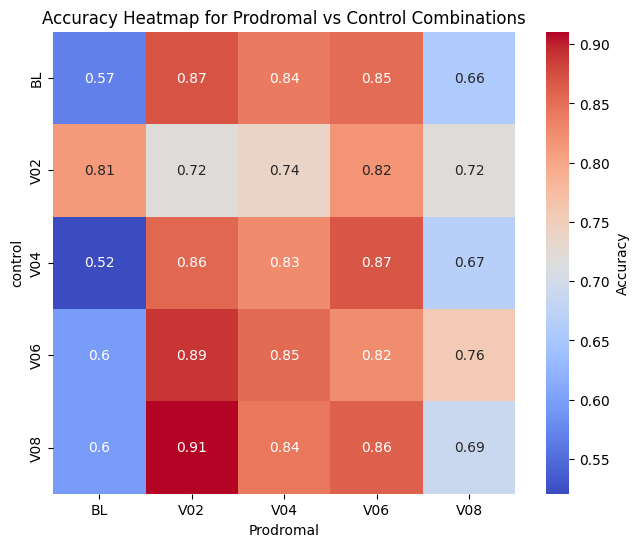

In [66]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

pro = []
Control= []
acc = []
for i,j in tqdm(ACCURACY_DICT.items()):
    pro.append(i.split('_')[1])
    Control.append(i.split('_')[-1])
    acc.append(j)


accuracy_table_pro_control = pd.DataFrame([pro,Control,acc]).T
accuracy_table_pro_control  = accuracy_table_pro_control .rename(columns = {0:'Prodromal', 1:'control', 2: 'Accuracy'})

accuracy_table_pro_control['Accuracy'] = accuracy_table_pro_control['Accuracy'].astype(float)
heatmap_data_ = accuracy_table_pro_control.pivot(index="control", columns="Prodromal", values="Accuracy")

# Plot the heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(heatmap_data_, annot=True, cmap="coolwarm", square=True, cbar_kws={'label': 'Accuracy'})
plt.title("Accuracy Heatmap for Prodromal vs Control Combinations")
plt.show()

In [ ]:
#FEATURE_IMPORTANCES['Prodromal_V08_Control_V08']
#sorted_0_dict_FEATURE_IMPORTANCES_asc = dict(sorted(FEATURE_IMPORTANCES['Prodromal_V08_Control_V08'].items(), key=lambda item: item[1]))

In [ ]:
#sorted_0_dict_FEATURE_IMPORTANCES_asc

In [ ]:
sorted_2_dict_FEATURE_IMPORTANCES_asc = dict(sorted(FEATURE_IMPORTANCES['Prodromal_V08_Control_V08_1'].items(), key=lambda item: item[1]))
sorted_2_dict_FEATURE_IMPORTANCES_asc

{'ENSG00000137073': -0.2767195603254906,
 'ENSG00000153310': -0.22011267037526705,
 'ENSG00000176624': -0.19822582688592474,
 'ENSG00000131979': -0.1826741800624082,
 'ENSG00000069275': -0.13155951791858175,
 'ENSG00000141699': -0.1262775190177091,
 'ENSG00000198502': -0.11341472951007563,
 'ENSG00000143226': -0.1025206094094427,
 'ENSG00000117280': -0.09953298524522844,
 'ENSG00000117533': -0.08654741979922737,
 'ENSG00000157540': -0.0858078316922413,
 'ENSG00000138760': -0.08024909279258356,
 'ENSG00000139793': -0.0777333427960148,
 'ENSG00000178177': -0.07636376190293695,
 'ENSG00000177200': -0.07507662982822678,
 'ENSG00000136492': -0.07370762444890638,
 'ENSG00000164733': -0.05555420162737867,
 'ENSG00000151338': -0.054901353772419746,
 'ENSG00000099381': -0.046085258567214224,
 'ENSG00000141431': -0.03953738735981297,
 'ENSG00000182568': -0.03647462061237175,
 'ENSG00000143772': -0.03052421067718565,
 'ENSG00000198825': -0.02971876735802879,
 'ENSG00000189157': -0.027971100071239

In [ ]:
data.DIAGNOSIS.value_counts()

DIAGNOSIS
PD           1716
Control       869
Prodromal     254
Name: count, dtype: int64

In [ ]:
data['DIAGNOSIS_2'] = data['DIAGNOSIS']

/tmp/ipykernel_173954/3022521848.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['DIAGNOSIS_2'] = data['DIAGNOSIS']


In [ ]:
data['DIAGNOSIS'].replace({'Control': '1.Control', 'Prodromal': '2.Prodromal', 'PD': '3.PD'}, inplace=True)

/tmp/ipykernel_173954/960865595.py:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  data['DIAGNOSIS'].replace({'Control': '1.Control', 'Prodromal': '2.Prodromal', 'PD': '3.PD'}, inplace=True)
/tmp/ipykernel_173954/960865595.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['DIAGNOSIS'].replace({'Control': '1.Control', 'Prodromal': '2.Pr

In [ ]:
data['New_Time_Point'] = data['DIAGNOSIS'] + '_' + data['Time_Point']
data['New_Time_Point_2'] = data['DIAGNOSIS_2'] + '_' + data['Time_Point']

/tmp/ipykernel_173954/3372653969.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['New_Time_Point'] = data['DIAGNOSIS'] + '_' + data['Time_Point']
/tmp/ipykernel_173954/3372653969.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['New_Time_Point_2'] = data['DIAGNOSIS_2'] + '_' + data['Time_Point']


In [ ]:
data = data.sort_values(by = 'New_Time_Point')

In [ ]:
tmp_data = data[data.Time_Point !='V02']

In [ ]:
tmp_data

,DIAGNOSIS,Patient_Name,Time_Point,ENSG00000198825,ENSG00000130787,ENSG00000147439,ENSG00000249231,ENSG00000136235,ENSG00000117533,ENSG00000143226,...,ENSG00000110315,ENSG00000161682,ENSG00000068745,ENSG00000151338,ENSG00000112306,ENSG00000069275,ENSG00000129003,DIAGNOSIS_2,New_Time_Point,New_Time_Point_2
2979,1.Control,4067,BL,3.34557,4.29506,31.58820,0.052879,0.364765,6.03974,259.5420,...,42.9861,1.140500,23.12140,2.915810,1208.740,17.80670,62.4584,Control,1.Control_BL,Control_BL
1675,1.Control,3555,BL,5.23329,5.22578,32.07920,0.000000,0.393256,5.88855,260.2490,...,44.8568,1.018410,20.79300,2.547690,771.298,15.95680,63.2388,Control,1.Control_BL,Control_BL
1672,1.Control,3554,BL,3.11499,4.75901,23.74370,0.023103,0.336108,7.08113,125.7860,...,23.3307,0.322730,15.58260,1.509350,836.366,16.45930,44.7453,Control,1.Control_BL,Control_BL
1663,1.Control,3551,BL,7.22355,8.81006,56.07980,0.000000,0.256780,9.64940,305.5530,...,44.1588,1.816200,41.29280,1.930460,1185.160,23.35850,100.0470,Control,1.Control_BL,Control_BL
1844,1.Control,3614,BL,2.86505,3.59603,18.02330,0.000000,0.149282,6.11721,107.4460,...,24.2233,0.606586,13.03650,1.186260,1201.490,13.45850,57.4930,Control,1.Control_BL,Control_BL
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1047,3.PD,3352,V08,1.08861,1.66795,9.24818,0.000000,0.061906,1.76626,69.3669,...,13.3780,0.188029,5.25804,0.537891,380.230,6.37793,15.8826,PD,3.PD_V08,PD_V08
3260,3.PD,4099,V08,3.59438,2.89427,36.83870,0.000000,0.147817,6.11337,312.3490,...,58.3811,1.123950,23.71930,1.926890,1753.860,23.35380,67.3766,PD,3.PD_V08,PD_V08
578,3.PD,3154,V08,3.98246,4.49988,26.15340,0.040262,0.343443,7.51254,194.1920,...,31.8437,0.907463,19.95360,2.309060,789.965,23.46580,65.7801,PD,3.PD_V08,PD_V08
1992,3.PD,3700,V08,4.71351,3.66953,22.18270,0.000000,0.193387,7.48336,197.9470,...,28.0031,0.409199,16.85670,1.733910,1674.230,17.10030,47.0339,PD,3.PD_V08,PD_V08


In [ ]:
df = pd.DataFrame(sorted_2_dict_FEATURE_IMPORTANCES_asc.items())
df[2] = np.abs(df[1])
df = df.sort_values(by = 2, ascending=False)
df

,0,1,2
0,ENSG00000137073,-0.276720,0.276720
81,ENSG00000109743,0.222677,0.222677
1,ENSG00000153310,-0.220113,0.220113
80,ENSG00000139218,0.217686,0.217686
79,ENSG00000071054,0.212713,0.212713
...,...,...,...
54,ENSG00000108379,-0.002171,0.002171
58,ENSG00000198208,0.001976,0.001976
55,ENSG00000120088,-0.001926,0.001926
57,ENSG00000114030,0.001913,0.001913


In [ ]:
tmp_data

,DIAGNOSIS,Patient_Name,Time_Point,ENSG00000198825,ENSG00000130787,ENSG00000147439,ENSG00000249231,ENSG00000136235,ENSG00000117533,ENSG00000143226,...,ENSG00000110315,ENSG00000161682,ENSG00000068745,ENSG00000151338,ENSG00000112306,ENSG00000069275,ENSG00000129003,DIAGNOSIS_2,New_Time_Point,New_Time_Point_2
2979,1.Control,4067,BL,3.34557,4.29506,31.58820,0.052879,0.364765,6.03974,259.5420,...,42.9861,1.140500,23.12140,2.915810,1208.740,17.80670,62.4584,Control,1.Control_BL,Control_BL
1675,1.Control,3555,BL,5.23329,5.22578,32.07920,0.000000,0.393256,5.88855,260.2490,...,44.8568,1.018410,20.79300,2.547690,771.298,15.95680,63.2388,Control,1.Control_BL,Control_BL
1672,1.Control,3554,BL,3.11499,4.75901,23.74370,0.023103,0.336108,7.08113,125.7860,...,23.3307,0.322730,15.58260,1.509350,836.366,16.45930,44.7453,Control,1.Control_BL,Control_BL
1663,1.Control,3551,BL,7.22355,8.81006,56.07980,0.000000,0.256780,9.64940,305.5530,...,44.1588,1.816200,41.29280,1.930460,1185.160,23.35850,100.0470,Control,1.Control_BL,Control_BL
1844,1.Control,3614,BL,2.86505,3.59603,18.02330,0.000000,0.149282,6.11721,107.4460,...,24.2233,0.606586,13.03650,1.186260,1201.490,13.45850,57.4930,Control,1.Control_BL,Control_BL
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1047,3.PD,3352,V08,1.08861,1.66795,9.24818,0.000000,0.061906,1.76626,69.3669,...,13.3780,0.188029,5.25804,0.537891,380.230,6.37793,15.8826,PD,3.PD_V08,PD_V08
3260,3.PD,4099,V08,3.59438,2.89427,36.83870,0.000000,0.147817,6.11337,312.3490,...,58.3811,1.123950,23.71930,1.926890,1753.860,23.35380,67.3766,PD,3.PD_V08,PD_V08
578,3.PD,3154,V08,3.98246,4.49988,26.15340,0.040262,0.343443,7.51254,194.1920,...,31.8437,0.907463,19.95360,2.309060,789.965,23.46580,65.7801,PD,3.PD_V08,PD_V08
1992,3.PD,3700,V08,4.71351,3.66953,22.18270,0.000000,0.193387,7.48336,197.9470,...,28.0031,0.409199,16.85670,1.733910,1674.230,17.10030,47.0339,PD,3.PD_V08,PD_V08


In [ ]:
tmp_data.New_Time_Point_2.unique()

array(['Control_BL', 'Control_V04', 'Control_V06', 'Control_V08',
       'Prodromal_BL', 'Prodromal_V04', 'Prodromal_V06', 'Prodromal_V08',
       'PD_BL', 'PD_V04', 'PD_V06', 'PD_V08'], dtype=object)

In [ ]:
genes = df[0].values.tolist()

In [ ]:
control_tmp_data = tmp_data[tmp_data['New_Time_Point_2'].str.startswith('Control')]
control_tmp_data = control_tmp_data.sort_values(by = 'New_Time_Point') 
control_tmp_data

,DIAGNOSIS,Patient_Name,Time_Point,ENSG00000198825,ENSG00000130787,ENSG00000147439,ENSG00000249231,ENSG00000136235,ENSG00000117533,ENSG00000143226,...,ENSG00000110315,ENSG00000161682,ENSG00000068745,ENSG00000151338,ENSG00000112306,ENSG00000069275,ENSG00000129003,DIAGNOSIS_2,New_Time_Point,New_Time_Point_2
2979,1.Control,4067,BL,3.34557,4.29506,31.58820,0.052879,0.364765,6.03974,259.5420,...,42.98610,1.140500,23.1214,2.915810,1208.740,17.80670,62.4584,Control,1.Control_BL,Control_BL
497,1.Control,3114,BL,2.71957,5.17357,26.41950,0.000000,0.250215,3.80543,157.2320,...,22.34800,0.817967,17.3704,1.903340,907.465,13.50360,44.4942,Control,1.Control_BL,Control_BL
782,1.Control,3222,BL,2.65901,1.93573,21.57940,0.000000,0.254178,4.27361,119.7030,...,25.51900,0.794321,13.0527,1.179810,729.864,11.49450,43.4593,Control,1.Control_BL,Control_BL
777,1.Control,3221,BL,3.78703,7.19952,22.04450,0.043717,0.205204,5.07759,158.5040,...,23.57870,0.478030,15.7820,1.690160,1296.830,17.30860,45.1880,Control,1.Control_BL,Control_BL
596,1.Control,3161,BL,2.78982,3.22321,18.11680,0.000000,0.094266,3.74914,178.4950,...,28.12820,0.432049,11.7351,1.189540,909.514,10.01770,33.2601,Control,1.Control_BL,Control_BL
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1090,1.Control,3361,V08,4.55669,3.35933,36.93710,0.190304,0.184405,4.40550,292.4110,...,47.49860,1.320220,19.6046,1.666590,952.190,11.61230,42.1625,Control,1.Control_V08,Control_V08
1722,1.Control,3570,V08,3.03861,2.81345,27.47040,0.037700,0.335681,5.56226,159.4420,...,31.70400,0.629660,21.0749,1.947700,784.413,19.10820,60.8739,Control,1.Control_V08,Control_V08
1598,1.Control,3523,V08,2.03910,1.73383,6.29063,0.000000,0.082091,3.65903,29.5983,...,9.45647,0.117681,7.0632,0.914449,864.724,9.03558,30.4579,Control,1.Control_V08,Control_V08
2498,1.Control,3950,V08,2.85642,6.13065,42.70210,0.000000,0.273081,4.08913,448.3450,...,31.04030,2.192270,24.9607,2.045480,625.326,9.87873,38.6180,Control,1.Control_V08,Control_V08


In [ ]:
def return_gene_name(ensembleid):

    try:
        return results[results['Gene stable ID'] == ensembleid]['Gene name'].values[0]
    except:
        print(ensembleid)
        return ensembleid


### 6. Expression of Genes with time 

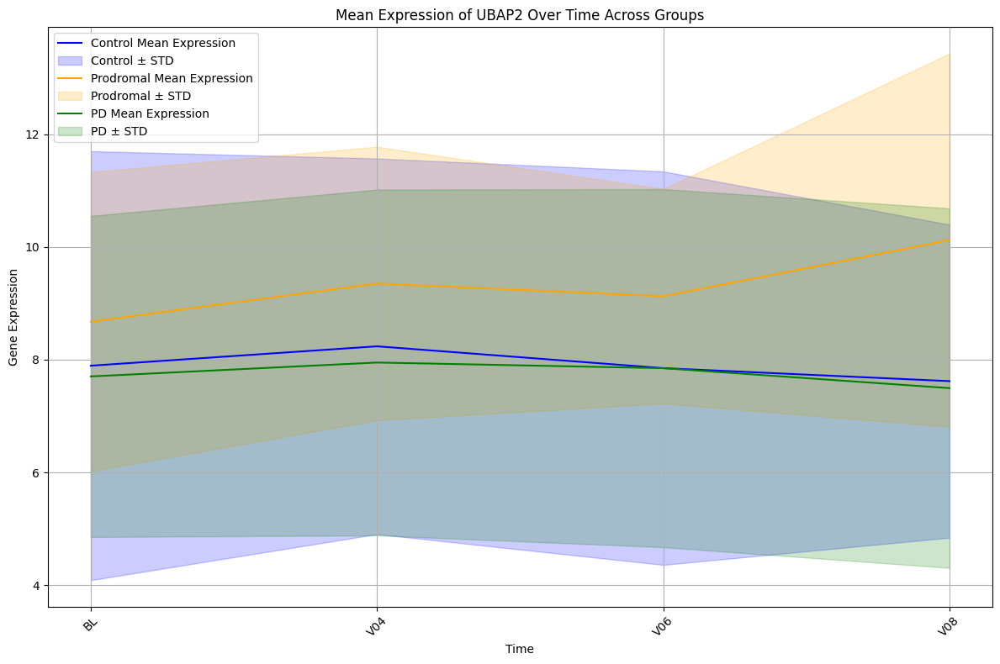

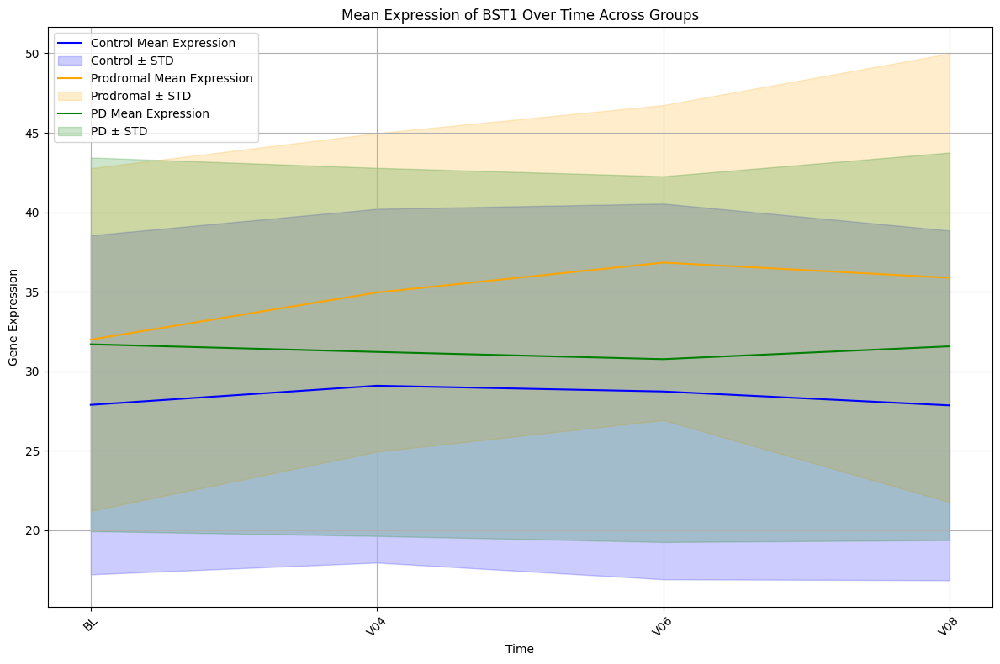

ENSG00000153310


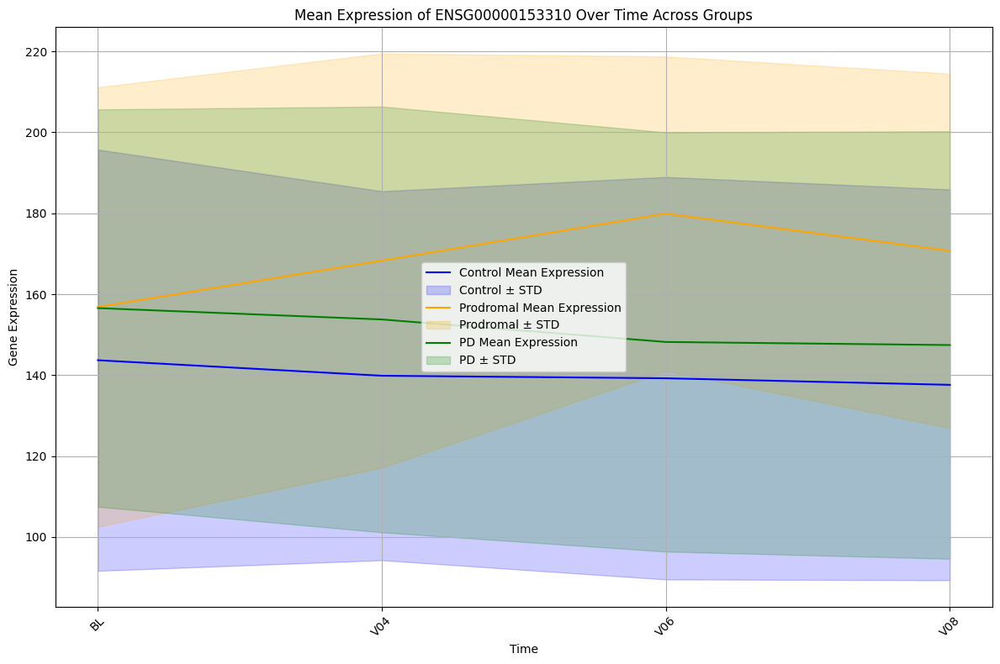

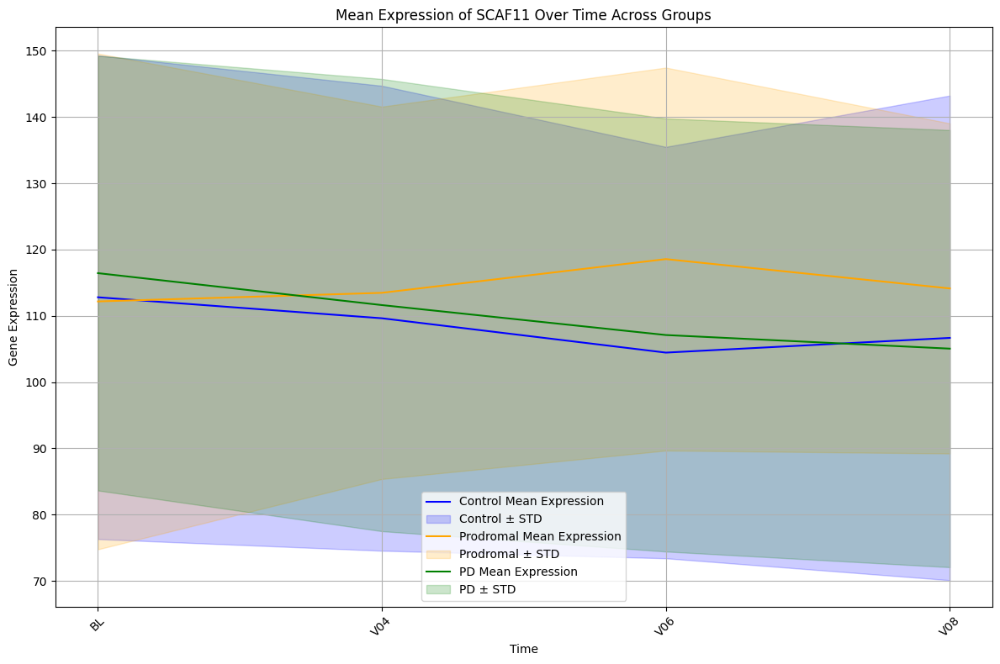

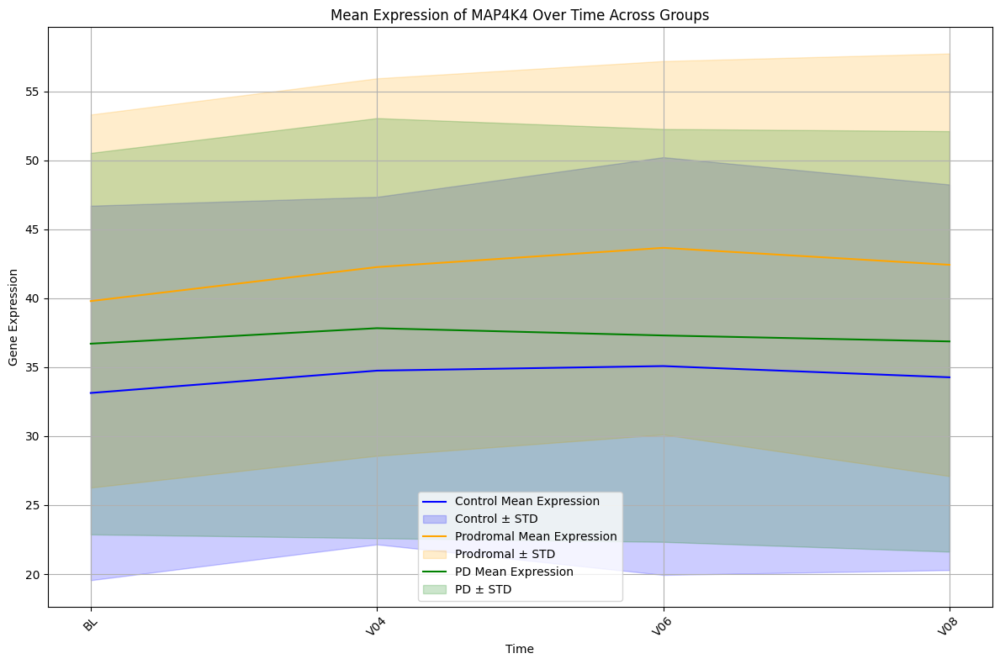

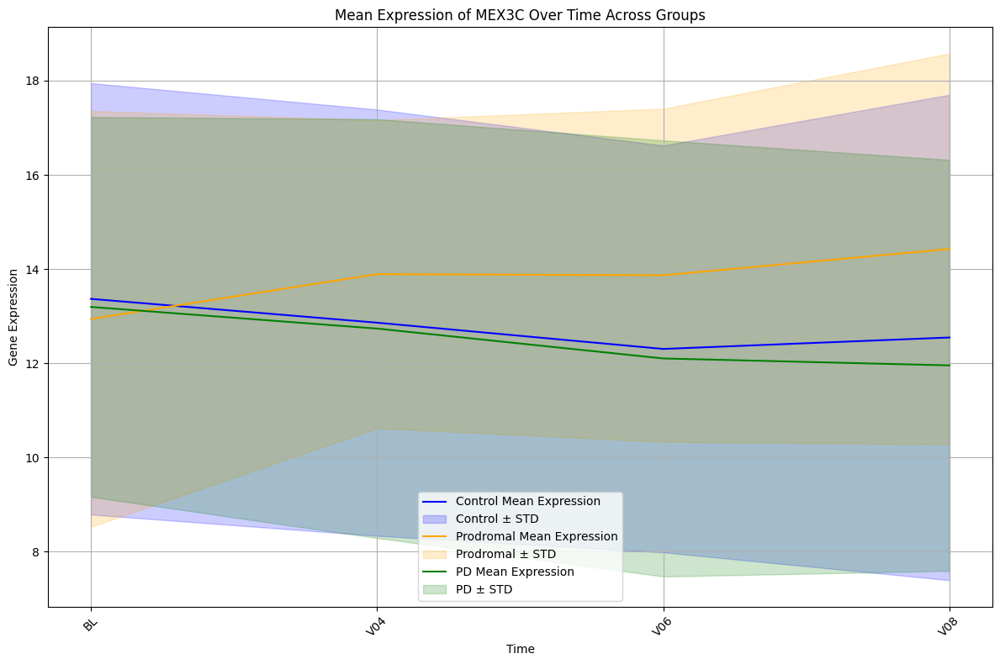

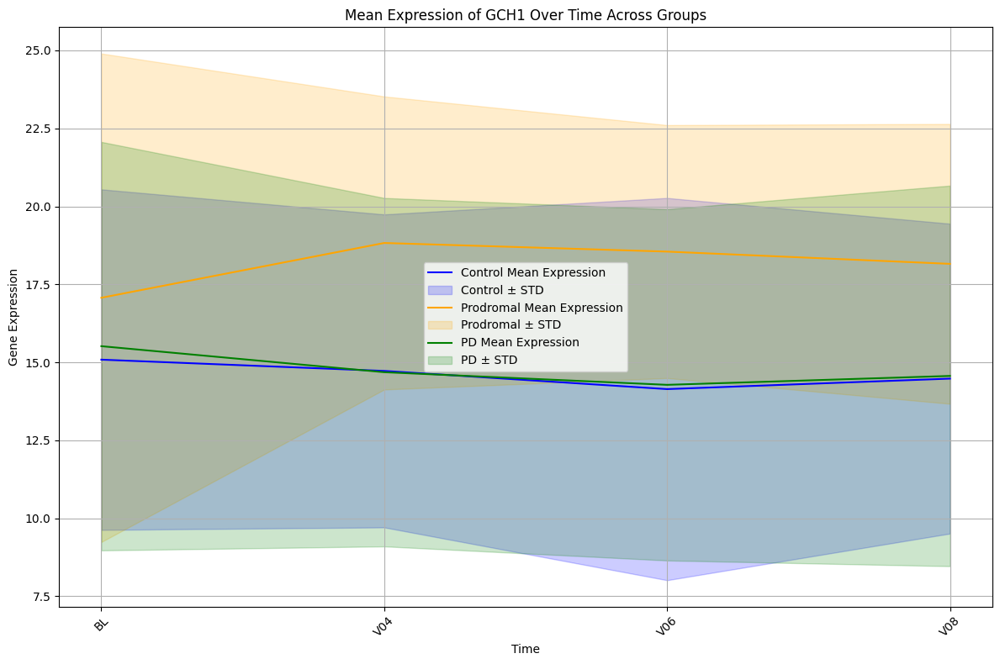

...

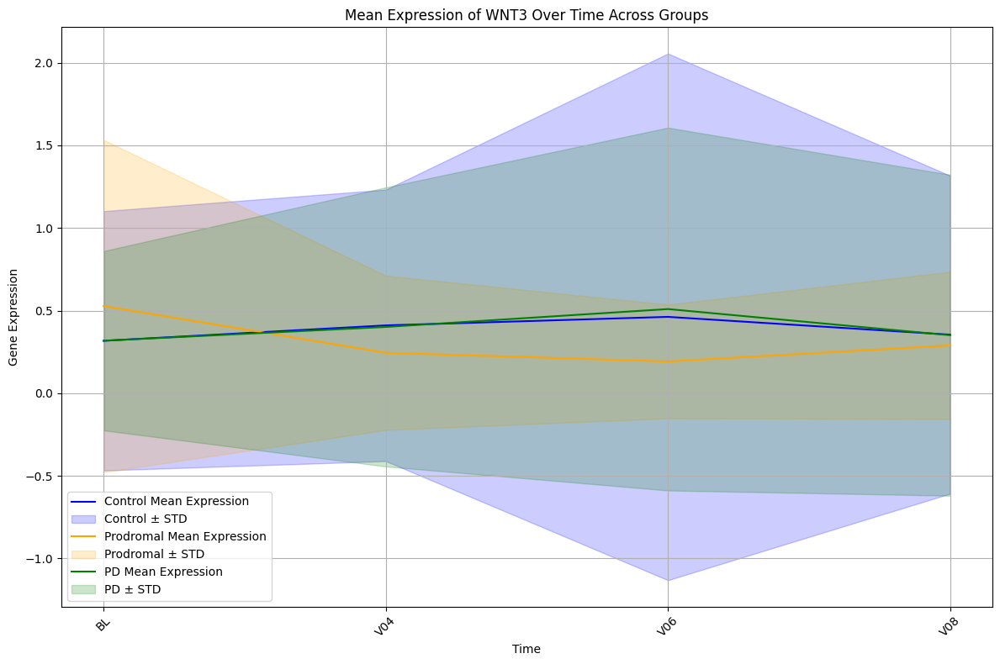

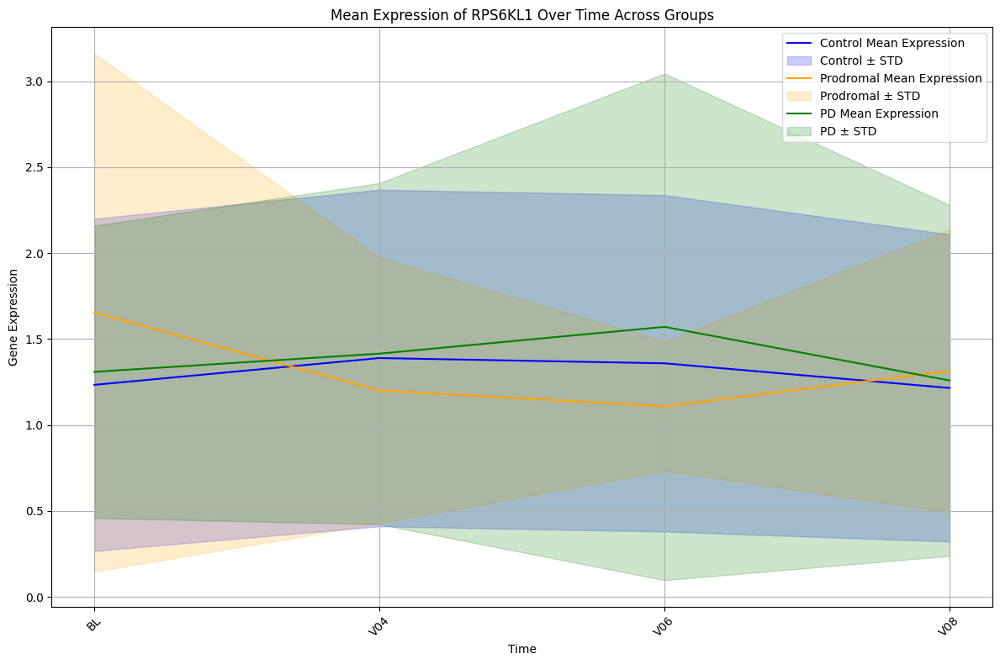

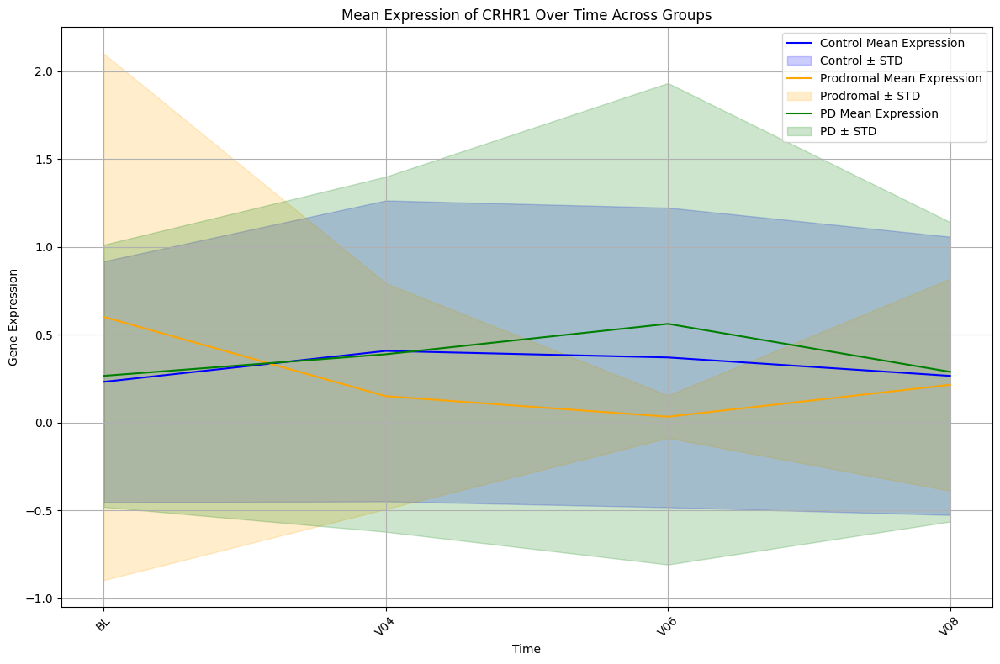

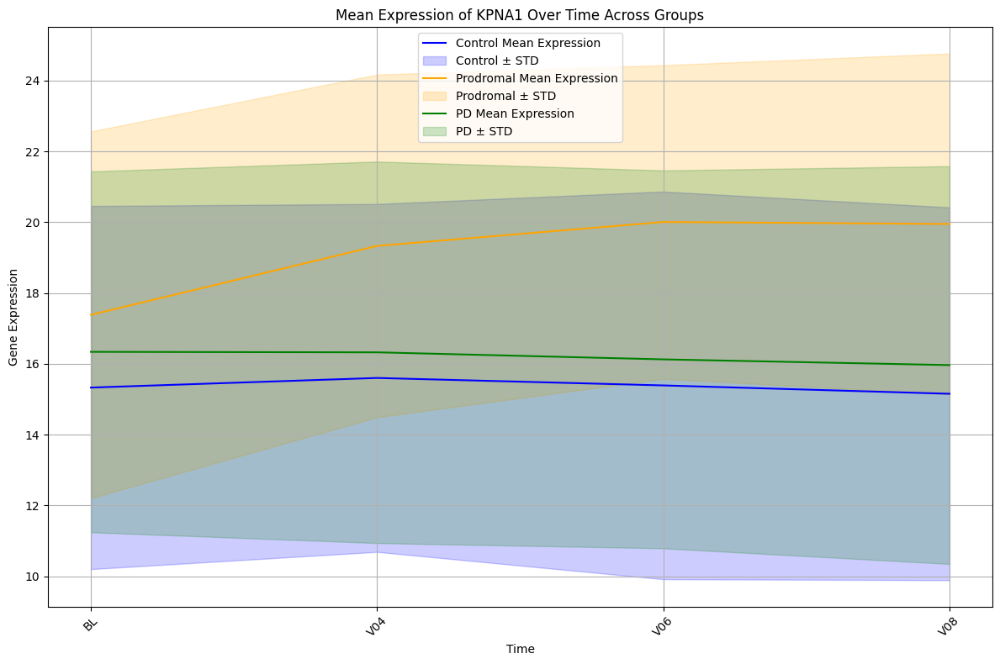

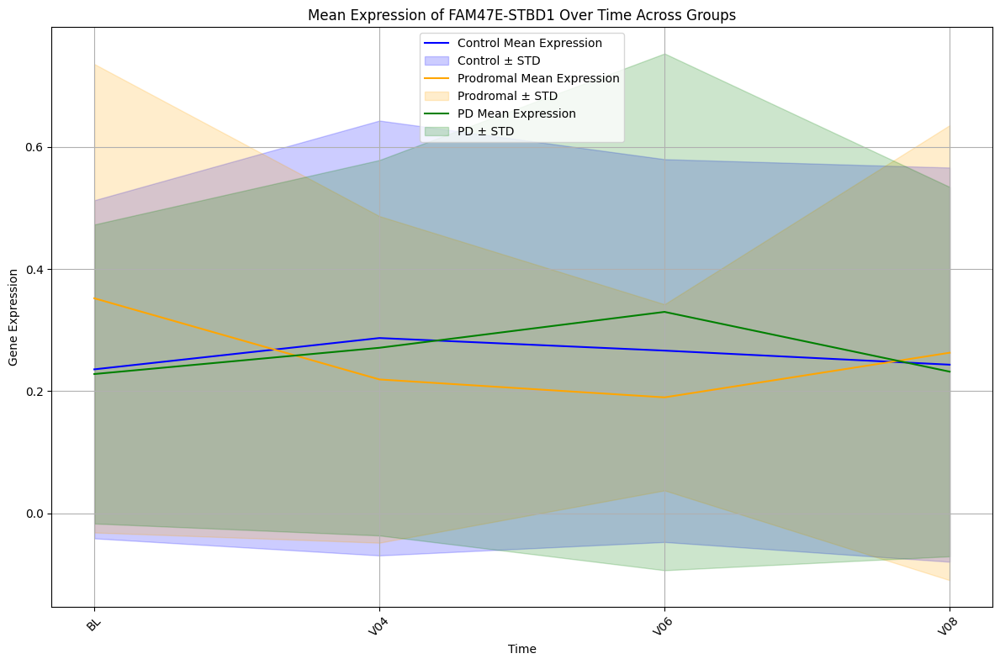

In [ ]:
import matplotlib.pyplot as plt

# Loop through each gene
for gene in genes:
    # Create a new figure for each gene
    plt.figure(figsize=(12, 8))
    
    # Define a list to store the group data
    groups = ['Control', 'Prodromal', 'PD']
    colors = {'Control': 'blue', 'Prodromal': 'orange', 'PD': 'green'}
    
    for group in groups:
        # Filter and sort data by group
        group_tmp_data = tmp_data[tmp_data['New_Time_Point_2'].str.startswith(group)]
        group_tmp_data = group_tmp_data.sort_values(by='New_Time_Point')
        
        # Calculate mean and standard deviation
        mean_expression = group_tmp_data.groupby('New_Time_Point')[gene].mean()
        std_expression = group_tmp_data.groupby('New_Time_Point')[gene].std()
        
        # Extract clean time points
        index = [i.split('_')[1] for i in mean_expression.index]
        
        # Plot mean expression
        plt.plot(index, mean_expression, color=colors[group], label=f'{group} Mean Expression')
        
        # Fill the standard deviation area
        plt.fill_between(index,
                         mean_expression - std_expression,
                         mean_expression + std_expression,
                         color=colors[group], alpha=0.2, label=f'{group} ± STD')
    
    # Customize plot
    plt.xlabel('Time')
    plt.ylabel('Gene Expression')
    gene  = return_gene_name(gene)
    plt.title(f'Mean Expression of {gene} Over Time Across Groups')
    plt.xticks(rotation=45)
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    
    # Show the plot
    plt.show()



In [ ]:
FEATURE_IMPORTANCES.keys()

dict_keys(['Prodromal_BL_Control_BL_0', 'Prodromal_BL_Control_BL_1', 'Prodromal_BL_Control_BL_2', 'Prodromal_BL_Control_BL_3', 'Prodromal_BL_Control_BL_4', 'Prodromal_BL_Control_BL_5', 'Prodromal_BL_Control_BL_6', 'Prodromal_BL_Control_BL_7', 'Prodromal_BL_Control_BL_8', 'Prodromal_BL_Control_BL_9', 'Prodromal_BL_Control_BL_10', 'Prodromal_BL_Control_BL_11', 'Prodromal_BL_Control_BL_12', 'Prodromal_BL_Control_BL_13', 'Prodromal_BL_Control_BL_14', 'Prodromal_BL_Control_BL_15', 'Prodromal_BL_Control_BL_16', 'Prodromal_BL_Control_BL_17', 'Prodromal_BL_Control_BL_18', 'Prodromal_BL_Control_BL_19', 'Prodromal_BL_Control_BL_20', 'Prodromal_BL_Control_BL_21', 'Prodromal_BL_Control_BL_22', 'Prodromal_BL_Control_BL_23', 'Prodromal_BL_Control_BL_24', 'Prodromal_BL_Control_BL_25', 'Prodromal_BL_Control_BL_26', 'Prodromal_BL_Control_BL_27', 'Prodromal_BL_Control_BL_28', 'Prodromal_BL_Control_BL_29', 'Prodromal_BL_Control_BL_30', 'Prodromal_BL_Control_BL_31', 'Prodromal_BL_Control_BL_32', 'Prodroma

In [ ]:
FEATURE_IMPORTANCES['Prodromal_V04_Control_V04_153']

{'ENSG00000198825': -0.043087217992767705,
 'ENSG00000130787': -0.09188876147201902,
 'ENSG00000147439': 0.31529114242931816,
 'ENSG00000249231': 0.016609380483440673,
 'ENSG00000136235': 0.02092266824816211,
 'ENSG00000117533': -0.14974673745815045,
 'ENSG00000143226': -0.04654067146442684,
 'ENSG00000150672': -0.06322895686470048,
 'ENSG00000139793': -0.49713178503729705,
 'ENSG00000139218': 0.25002164551958517,
 'ENSG00000187775': 0.023031902420671768,
 'ENSG00000153310': 0.03305171921715311,
 'ENSG00000164181': 0.18012492322146026,
 'ENSG00000178177': -0.28599054700204507,
 'ENSG00000137073': -0.4834309928885359,
 'ENSG00000176624': -0.5940390638232944,
 'ENSG00000181904': 0.058922340112706896,
 'ENSG00000163344': -0.11474252829164677,
 'ENSG00000196542': -0.06843408510253375,
 'ENSG00000078579': 0.018810663257873544,
 'ENSG00000189157': 0.061893746415669214,
 'ENSG00000071054': 0.1549414659218839,
 'ENSG00000138760': 0.3756470899499463,
 'ENSG00000145730': -0.015521719217647448,
 

In [ ]:
compare_list = ['Prodromal_BL_Control_BL',  'Prodromal_V02_Control_V02' ,'Prodromal_V04_Control_V04', 'Prodromal_V06_Control_V06', 'Prodromal_V08_Control_V08']

In [ ]:
FEATURE_IMPORTANCES_Prodromal_BL_Control_BL = dict()
FEATURE_IMPORTANCES_Prodromal_V02_Control_V02 = dict()
FEATURE_IMPORTANCES_Prodromal_V04_Control_V04 = dict()
FEATURE_IMPORTANCES_Prodromal_V06_Control_V06 = dict()
FEATURE_IMPORTANCES_Prodromal_V08_Control_V08 = dict()

for i in FEATURE_IMPORTANCES.keys():
    if 'Prodromal_BL_Control_BL' in i:
        FEATURE_IMPORTANCES_Prodromal_BL_Control_BL[i] = FEATURE_IMPORTANCES[i]

    elif 'Prodromal_V02_Control_V02' in i:
        FEATURE_IMPORTANCES_Prodromal_V02_Control_V02[i] = FEATURE_IMPORTANCES[i]

    elif 'Prodromal_V04_Control_V04' in i:
        FEATURE_IMPORTANCES_Prodromal_V04_Control_V04[i] = FEATURE_IMPORTANCES[i]

    elif 'Prodromal_V06_Control_V06' in i:
        FEATURE_IMPORTANCES_Prodromal_V06_Control_V06[i] = FEATURE_IMPORTANCES[i]

    elif 'Prodromal_V08_Control_V08' in i:
        FEATURE_IMPORTANCES_Prodromal_V08_Control_V08[i] = FEATURE_IMPORTANCES[i]
        
        

In [ ]:
list(FEATURE_IMPORTANCES_Prodromal_BL_Control_BL.keys())[:10]

['Prodromal_BL_Control_BL_0',
 'Prodromal_BL_Control_BL_1',
 'Prodromal_BL_Control_BL_2',
 'Prodromal_BL_Control_BL_3',
 'Prodromal_BL_Control_BL_4',
 'Prodromal_BL_Control_BL_5',
 'Prodromal_BL_Control_BL_6',
 'Prodromal_BL_Control_BL_7',
 'Prodromal_BL_Control_BL_8',
 'Prodromal_BL_Control_BL_9']

In [ ]:
genes_list = list(FEATURE_IMPORTANCES_Prodromal_BL_Control_BL['Prodromal_BL_Control_BL_0'].keys())

In [ ]:
genes_list[0:10]

['ENSG00000198825',
 'ENSG00000130787',
 'ENSG00000147439',
 'ENSG00000249231',
 'ENSG00000136235',
 'ENSG00000117533',
 'ENSG00000143226',
 'ENSG00000150672',
 'ENSG00000139793',
 'ENSG00000139218']

In [ ]:
len(FEATURE_IMPORTANCES_Prodromal_BL_Control_BL.keys())

1000

In [ ]:
AVG_FEATURE_IMPORTANCES_Prodromal_BL_Control_BL = dict()
for i in genes_list:
    s = 0
    for k in FEATURE_IMPORTANCES_Prodromal_BL_Control_BL.keys():
        s += FEATURE_IMPORTANCES_Prodromal_BL_Control_BL[k][i]
    s = s/len(FEATURE_IMPORTANCES_Prodromal_BL_Control_BL.keys())
    AVG_FEATURE_IMPORTANCES_Prodromal_BL_Control_BL[i] = s


AVG_FEATURE_IMPORTANCES_Prodromal_V02_Control_V02 = dict()
for i in genes_list:
    s = 0
    for k in FEATURE_IMPORTANCES_Prodromal_V02_Control_V02.keys():
        s += FEATURE_IMPORTANCES_Prodromal_V02_Control_V02[k][i]
    s = s/len(FEATURE_IMPORTANCES_Prodromal_V02_Control_V02.keys())
    AVG_FEATURE_IMPORTANCES_Prodromal_V02_Control_V02[i] = s


AVG_FEATURE_IMPORTANCES_Prodromal_V04_Control_V04 = dict()
for i in genes_list:
    s = 0
    for k in FEATURE_IMPORTANCES_Prodromal_V04_Control_V04.keys():
        s += FEATURE_IMPORTANCES_Prodromal_V04_Control_V04[k][i]
    s = s/len(FEATURE_IMPORTANCES_Prodromal_V04_Control_V04.keys())
    AVG_FEATURE_IMPORTANCES_Prodromal_V04_Control_V04[i] = s


AVG_FEATURE_IMPORTANCES_Prodromal_V06_Control_V06 = dict()
for i in genes_list:
    s = 0
    for k in FEATURE_IMPORTANCES_Prodromal_V06_Control_V06.keys():
        s += FEATURE_IMPORTANCES_Prodromal_V06_Control_V06[k][i]
    s = s/len(FEATURE_IMPORTANCES_Prodromal_V06_Control_V06.keys())
    AVG_FEATURE_IMPORTANCES_Prodromal_V06_Control_V06[i] = s


AVG_FEATURE_IMPORTANCES_Prodromal_V08_Control_V08 = dict()
for i in genes_list:
    s = 0
    for k in FEATURE_IMPORTANCES_Prodromal_V08_Control_V08.keys():
        s += FEATURE_IMPORTANCES_Prodromal_V08_Control_V08[k][i]
    s = s/len(FEATURE_IMPORTANCES_Prodromal_V08_Control_V08.keys())
    AVG_FEATURE_IMPORTANCES_Prodromal_V08_Control_V08[i] = s
      

In [ ]:
AVG_FEATURE_IMPORTANCES_Prodromal_BL_Control_BL

{'ENSG00000198825': -0.18093716491903813,
 'ENSG00000130787': -0.2751334174573763,
 'ENSG00000147439': 0.30442214114769583,
 'ENSG00000249231': 0.18144853955052215,
 'ENSG00000136235': -0.06922880476341535,
 'ENSG00000117533': 0.19441498170101165,
 'ENSG00000143226': 0.002149473228151919,
 'ENSG00000150672': 0.4568879682296792,
 'ENSG00000139793': 0.19313641508375515,
 'ENSG00000139218': -0.05266524640759812,
 'ENSG00000187775': -0.4624781440993255,
 'ENSG00000153310': -0.01412035695540436,
 'ENSG00000164181': -0.16091170301122376,
 'ENSG00000178177': 0.2930324532082065,
 'ENSG00000137073': -0.26688313841331424,
 'ENSG00000176624': -0.2569502380586438,
 'ENSG00000181904': -0.5183327875459793,
 'ENSG00000163344': -0.1003615049137061,
 'ENSG00000196542': -0.07688388171673197,
 'ENSG00000078579': -0.011236815069398063,
 'ENSG00000189157': -0.5744621866627035,
 'ENSG00000071054': -0.18377992216611908,
 'ENSG00000138760': 0.2998535958406831,
 'ENSG00000145730': -0.07980054358704185,
 'ENSG0

In [ ]:
AVG_FEATURE_IMPORTANCES_Prodromal_V02_Control_V02

{'ENSG00000198825': -0.1198609777763482,
 'ENSG00000130787': 0.6181025829044561,
 'ENSG00000147439': 0.49988443262094256,
 'ENSG00000249231': 0.06080366596355568,
 'ENSG00000136235': -0.06536992408333016,
 'ENSG00000117533': 0.07052049767235809,
 'ENSG00000143226': -0.013566352314950613,
 'ENSG00000150672': -0.1447954409836805,
 'ENSG00000139793': 0.47317002525189233,
 'ENSG00000139218': 0.33519109554212007,
 'ENSG00000187775': -0.06636195700717636,
 'ENSG00000153310': -0.16269121731240796,
 'ENSG00000164181': 0.12046252247225943,
 'ENSG00000178177': -0.5220028685133551,
 'ENSG00000137073': 0.09933472644605974,
 'ENSG00000176624': -0.5836587787383909,
 'ENSG00000181904': -0.14391837869027374,
 'ENSG00000163344': -0.17684308781977245,
 'ENSG00000196542': 0.09301562766791029,
 'ENSG00000078579': -0.04461725411870024,
 'ENSG00000189157': -0.1646658963543025,
 'ENSG00000071054': 0.1665352774006815,
 'ENSG00000138760': 0.10831333368175526,
 'ENSG00000145730': 0.06495143220351969,
 'ENSG0000

In [ ]:
compare_list

['Prodromal_BL_Control_BL',
 'Prodromal_V02_Control_V02',
 'Prodromal_V04_Control_V04',
 'Prodromal_V06_Control_V06',
 'Prodromal_V08_Control_V08']

In [ ]:
FEATURE_IMPORTANCES_MERGE = dict()
FEATURE_IMPORTANCES_MERGE['Prodromal_BL_Control_BL'] = AVG_FEATURE_IMPORTANCES_Prodromal_BL_Control_BL
FEATURE_IMPORTANCES_MERGE['Prodromal_V02_Control_V02'] = AVG_FEATURE_IMPORTANCES_Prodromal_V02_Control_V02
FEATURE_IMPORTANCES_MERGE['Prodromal_V04_Control_V04'] = AVG_FEATURE_IMPORTANCES_Prodromal_V04_Control_V04
FEATURE_IMPORTANCES_MERGE['Prodromal_V06_Control_V06'] = AVG_FEATURE_IMPORTANCES_Prodromal_V06_Control_V06
FEATURE_IMPORTANCES_MERGE['Prodromal_V08_Control_V08'] = AVG_FEATURE_IMPORTANCES_Prodromal_V08_Control_V08


In [ ]:
pd.DataFrame(FEATURE_IMPORTANCES_MERGE['Prodromal_BL_Control_BL'].items())

,0,1
0,ENSG00000198825,-0.180937
1,ENSG00000130787,-0.275133
2,ENSG00000147439,0.304422
3,ENSG00000249231,0.181449
4,ENSG00000136235,-0.069229
...,...,...
77,ENSG00000068745,0.293797
78,ENSG00000151338,-0.202503
79,ENSG00000112306,-0.000758
80,ENSG00000069275,0.107085


In [ ]:
ranking_of_features = []
for i in compare_list:


    df = pd.DataFrame(FEATURE_IMPORTANCES_MERGE[i].items())
    df[2] = np.abs(df[1])
    df = df.sort_values(by = 2, ascending=False)
    print(df)
    ranking_of_features.append(df[0].tolist())


                  0         1         2
74  ENSG00000131979 -0.734287  0.734287
39  ENSG00000143772 -0.721637  0.721637
55  ENSG00000005206  0.685352  0.685352
29  ENSG00000114030 -0.674978  0.674978
54  ENSG00000144893 -0.656925  0.656925
..              ...       ...       ...
6   ENSG00000143226  0.002149  0.002149
51  ENSG00000145335  0.001318  0.001318
71  ENSG00000108379 -0.001060  0.001060
79  ENSG00000112306 -0.000758  0.000758
47  ENSG00000188906 -0.000686  0.000686

[82 rows x 3 columns]
                  0         1         2
39  ENSG00000143772 -1.020519  1.020519
74  ENSG00000131979 -0.734844  0.734844
1   ENSG00000130787  0.618103  0.618103
58  ENSG00000108312  0.597762  0.597762
15  ENSG00000176624 -0.583659  0.583659
..              ...       ...       ...
79  ENSG00000112306 -0.014117  0.014117
6   ENSG00000143226 -0.013566  0.013566
42  ENSG00000272414 -0.005347  0.005347
51  ENSG00000145335  0.005009  0.005009
68  ENSG00000170175  0.003485  0.003485

[82 rows x 3 col

In [ ]:
ranking_of_features[4][0:10]

['ENSG00000137073',
 'ENSG00000139218',
 'ENSG00000163463',
 'ENSG00000167207',
 'ENSG00000109743',
 'ENSG00000198502',
 'ENSG00000151338',
 'ENSG00000131979',
 'ENSG00000069275',
 'ENSG00000153310']

In [ ]:
gene_lists = ranking_of_features

In [ ]:
gene_lists

[['ENSG00000131979',
  'ENSG00000143772',
  'ENSG00000005206',
  'ENSG00000114030',
  'ENSG00000144893',
  'ENSG00000189157',
  'ENSG00000116991',
  'ENSG00000181904',
  'ENSG00000108312',
  'ENSG00000187775',
  'ENSG00000150672',
  'ENSG00000161682',
  'ENSG00000080854',
  'ENSG00000102547',
  'ENSG00000163463',
  'ENSG00000099381',
  'ENSG00000129003',
  'ENSG00000109743',
  'ENSG00000147439',
  'ENSG00000177200',
  'ENSG00000138760',
  'ENSG00000068745',
  'ENSG00000178177',
  'ENSG00000130787',
  'ENSG00000137073',
  'ENSG00000176624',
  'ENSG00000103528',
  'ENSG00000151929',
  'ENSG00000198648',
  'ENSG00000077943',
  'ENSG00000136492',
  'ENSG00000151338',
  'ENSG00000117533',
  'ENSG00000139793',
  'ENSG00000167207',
  'ENSG00000071054',
  'ENSG00000249231',
  'ENSG00000198825',
  'ENSG00000120088',
  'ENSG00000141431',
  'ENSG00000164181',
  'ENSG00000112787',
  'ENSG00000088766',
  'ENSG00000170745',
  'ENSG00000117280',
  'ENSG00000107862',
  'ENSG00000078070',
  'ENSG000001

In [ ]:
gene_indices = {}

# Loop through each list and index each gene
for list_idx, gene_list in enumerate(gene_lists):
    for gene_idx, gene in enumerate(gene_list):
        # Initialize the gene's entry if not present
        if gene not in gene_indices:
            gene_indices[gene] = [-1] * len(gene_lists)  # Default -1 for lists where gene is absent
        # Update the index of the gene in the current list
        gene_indices[gene][list_idx] = gene_idx

# Display results
for gene, indices in gene_indices.items():
    print(f"{gene}: {indices}")

ENSG00000131979: [0, 1, 0, 3, 7]
ENSG00000143772: [1, 0, 25, 8, 19]
ENSG00000005206: [2, 10, 2, 2, 38]
ENSG00000114030: [3, 21, 10, 45, 27]
ENSG00000144893: [4, 23, 58, 49, 55]
ENSG00000189157: [5, 27, 75, 64, 25]
ENSG00000116991: [6, 52, 28, 48, 30]
ENSG00000181904: [7, 32, 41, 7, 31]
ENSG00000108312: [8, 3, 37, 18, 26]
ENSG00000187775: [9, 58, 76, 55, 76]
ENSG00000150672: [10, 31, 56, 60, 52]
ENSG00000161682: [11, 49, 15, 28, 58]
ENSG00000080854: [12, 13, 44, 40, 74]
ENSG00000102547: [13, 30, 63, 74, 57]
ENSG00000163463: [14, 69, 1, 4, 2]
ENSG00000099381: [15, 72, 17, 36, 33]
ENSG00000129003: [16, 29, 26, 32, 48]
ENSG00000109743: [17, 54, 35, 39, 4]
ENSG00000147439: [18, 8, 23, 19, 39]
ENSG00000177200: [19, 19, 4, 9, 29]
ENSG00000138760: [20, 41, 3, 27, 20]
ENSG00000068745: [21, 74, 27, 0, 12]
ENSG00000178177: [22, 7, 6, 1, 53]
ENSG00000130787: [23, 2, 62, 35, 51]
ENSG00000137073: [24, 46, 30, 33, 0]
ENSG00000176624: [25, 4, 5, 15, 10]
ENSG00000103528: [26, 53, 46, 41, 70]
ENSG000001

In [ ]:
ranking_df = pd.DataFrame(gene_indices).T
ranking_df.columns = ['BL','V02','V04','V06','V08']

In [ ]:
ranking_df

,BL,V02,V04,V06,V08
ENSG00000131979,0,1,0,3,7
ENSG00000143772,1,0,25,8,19
ENSG00000005206,2,10,2,2,38
ENSG00000114030,3,21,10,45,27
ENSG00000144893,4,23,58,49,55
...,...,...,...,...,...
ENSG00000143226,77,78,66,52,13
ENSG00000145335,78,80,79,78,67
ENSG00000108379,79,75,61,44,81
ENSG00000112306,80,77,81,70,64


In [ ]:
def return_gene_name(ensembleid):

    try:
        return results[results['Gene stable ID'] == ensembleid]['Gene name'].values[0]
    except:
        return np.nan

In [ ]:
tmp_df = ranking_df.reset_index()
ranking_df['Gene_Name'] =tmp_df['index'].apply(return_gene_name).tolist()

In [ ]:
ranking_df[ranking_df.Gene_Name.isna()]

,BL,V02,V04,V06,V08,Gene_Name
ENSG00000153310,72,28,74,66,9,NaN


In [ ]:
ranking_df.loc['ENSG00000153310','Gene_Name'] = 'FAM49B'


In [ ]:
ranking_df.set_index('Gene_Name',inplace=True)
ranking_df

,BL,V02,V04,V06,V08
Gene_Name,,,,,
GCH1,0,1,0,3,7
ITPKB,1,0,25,8,19
SPPL2B,2,10,2,2,38
KPNA1,3,21,10,45,27
MED12L,4,23,58,49,55
...,...,...,...,...,...
FCGR2A,77,78,66,52,13
SNCA,78,80,79,78,67
WNT3,79,75,61,44,81


In [ ]:
ranking_df.to_csv('ranking_df/LANCET_pd_genes_control_to_prodromal_ranking_df.csv', index=True)

In [ ]:
!pwd

/12tb_dsk3/PD_classifier/with_smug_1/New_Gene_sets


In [ ]:
ranking_of_features

[['ENSG00000131979',
  'ENSG00000143772',
  'ENSG00000005206',
  'ENSG00000114030',
  'ENSG00000144893',
  'ENSG00000189157',
  'ENSG00000116991',
  'ENSG00000181904',
  'ENSG00000108312',
  'ENSG00000187775',
  'ENSG00000150672',
  'ENSG00000161682',
  'ENSG00000080854',
  'ENSG00000102547',
  'ENSG00000163463',
  'ENSG00000099381',
  'ENSG00000129003',
  'ENSG00000109743',
  'ENSG00000147439',
  'ENSG00000177200',
  'ENSG00000138760',
  'ENSG00000068745',
  'ENSG00000178177',
  'ENSG00000130787',
  'ENSG00000137073',
  'ENSG00000176624',
  'ENSG00000103528',
  'ENSG00000151929',
  'ENSG00000198648',
  'ENSG00000077943',
  'ENSG00000136492',
  'ENSG00000151338',
  'ENSG00000117533',
  'ENSG00000139793',
  'ENSG00000167207',
  'ENSG00000071054',
  'ENSG00000249231',
  'ENSG00000198825',
  'ENSG00000120088',
  'ENSG00000141431',
  'ENSG00000164181',
  'ENSG00000112787',
  'ENSG00000088766',
  'ENSG00000170745',
  'ENSG00000117280',
  'ENSG00000107862',
  'ENSG00000078070',
  'ENSG000001

In [ ]:
subset_dict = {key: gene_indices[key] for key in ranking_of_features[4] if key in gene_indices}

print(subset_dict)

{'ENSG00000137073': [24, 46, 30, 33, 0], 'ENSG00000139218': [62, 12, 29, 56, 1], 'ENSG00000163463': [14, 69, 1, 4, 2], 'ENSG00000167207': [34, 16, 73, 22, 3], 'ENSG00000109743': [17, 54, 35, 39, 4], 'ENSG00000198502': [71, 76, 67, 46, 5], 'ENSG00000151338': [31, 6, 7, 6, 6], 'ENSG00000131979': [0, 1, 0, 3, 7], 'ENSG00000069275': [49, 5, 31, 38, 8], 'ENSG00000153310': [72, 28, 74, 66, 9], 'ENSG00000176624': [25, 4, 5, 15, 10], 'ENSG00000164733': [76, 63, 51, 42, 11], 'ENSG00000068745': [21, 74, 27, 0, 12], 'ENSG00000143226': [77, 78, 66, 52, 13], 'ENSG00000141699': [63, 20, 40, 20, 14], 'ENSG00000157540': [73, 39, 13, 13, 15], 'ENSG00000054983': [54, 55, 14, 12, 16], 'ENSG00000109572': [70, 47, 19, 5, 17], 'ENSG00000071054': [35, 26, 20, 37, 18], 'ENSG00000143772': [1, 0, 25, 8, 19], 'ENSG00000138760': [20, 41, 3, 27, 20], 'ENSG00000117280': [44, 15, 9, 11, 21], 'ENSG00000117533': [32, 57, 24, 10, 22], 'ENSG00000139793': [33, 9, 8, 17, 23], 'ENSG00000145730': [55, 61, 49, 77, 24], 'ENSG

In [ ]:
len(subset_dict)

82

In [ ]:
subset_dict.values()

dict_values([[24, 46, 30, 33, 0], [62, 12, 29, 56, 1], [14, 69, 1, 4, 2], [34, 16, 73, 22, 3], [17, 54, 35, 39, 4], [71, 76, 67, 46, 5], [31, 6, 7, 6, 6], [0, 1, 0, 3, 7], [49, 5, 31, 38, 8], [72, 28, 74, 66, 9], [25, 4, 5, 15, 10], [76, 63, 51, 42, 11], [21, 74, 27, 0, 12], [77, 78, 66, 52, 13], [63, 20, 40, 20, 14], [73, 39, 13, 13, 15], [54, 55, 14, 12, 16], [70, 47, 19, 5, 17], [35, 26, 20, 37, 18], [1, 0, 25, 8, 19], [20, 41, 3, 27, 20], [44, 15, 9, 11, 21], [32, 57, 24, 10, 22], [33, 9, 8, 17, 23], [55, 61, 49, 77, 24], [5, 27, 75, 64, 25], [8, 3, 37, 18, 26], [3, 21, 10, 45, 27], [30, 11, 16, 59, 28], [19, 19, 4, 9, 29], [6, 52, 28, 48, 30], [7, 32, 41, 7, 31], [28, 22, 12, 14, 32], [15, 72, 17, 36, 33], [51, 34, 18, 51, 34], [37, 38, 71, 26, 35], [66, 67, 65, 69, 36], [40, 37, 22, 50, 37], [2, 10, 2, 2, 38], [18, 8, 23, 19, 39], [59, 36, 34, 31, 40], [39, 42, 33, 75, 41], [57, 40, 11, 34, 42], [45, 14, 42, 25, 43], [46, 44, 39, 23, 44], [42, 17, 43, 16, 45], [41, 51, 36, 30, 46

In [ ]:
# Original dictionary with gene rankings
'''gene_ranks = subset_dict


# Flatten the list to find the min and max values across all rankings
all_ranks = [rank for ranks in gene_ranks.values() for rank in ranks]
min_rank, max_rank = min(all_ranks), max(all_ranks)

# Normalize each ranking
normalized_gene_ranks = {
    gene: [(rank - min_rank) / (max_rank - min_rank) * 10 for rank in ranks]
    for gene, ranks in gene_ranks.items()
}

# Display the normalized rankings
for gene, normalized_ranks in normalized_gene_ranks.items():
    print(f"{gene}: {normalized_ranks}")
'''

'gene_ranks = subset_dict\n\n\n# Flatten the list to find the min and max values across all rankings\nall_ranks = [rank for ranks in gene_ranks.values() for rank in ranks]\nmin_rank, max_rank = min(all_ranks), max(all_ranks)\n\n# Normalize each ranking\nnormalized_gene_ranks = {\n    gene: [(rank - min_rank) / (max_rank - min_rank) * 10 for rank in ranks]\n    for gene, ranks in gene_ranks.items()\n}\n\n# Display the normalized rankings\nfor gene, normalized_ranks in normalized_gene_ranks.items():\n    print(f"{gene}: {normalized_ranks}")\n'

In [ ]:
gene_ranks = subset_dict
df = pd.DataFrame(gene_ranks).T
df

,0,1,2,3,4
ENSG00000137073,24,46,30,33,0
ENSG00000139218,62,12,29,56,1
ENSG00000163463,14,69,1,4,2
ENSG00000167207,34,16,73,22,3
ENSG00000109743,17,54,35,39,4
...,...,...,...,...,...
ENSG00000204614,67,73,52,73,77
ENSG00000078579,74,64,72,72,78
ENSG00000196542,56,48,48,21,79
ENSG00000170175,75,81,78,53,80


In [ ]:
def return_gene_name(ensembleid):

    try:
        return results[results['Gene stable ID'] == ensembleid]['Gene name'].values[0]
    except:
        return np.nan

tmp_df = df.reset_index()
df['Gene_Name'] =tmp_df['index'].apply(return_gene_name).tolist()
df.loc['ENSG00000153310','Gene_Name'] = 'FAM49B'
df.set_index('Gene_Name',inplace=True)

In [ ]:
df

,0,1,2,3,4
Gene_Name,,,,,
UBAP2,24,46,30,33,0
SCAF11,62,12,29,56,1
KRTCAP2,14,69,1,4,2
NOD2,34,16,73,22,3
BST1,17,54,35,39,4
...,...,...,...,...,...
TRIM40,67,73,52,73,77
FGF20,74,64,72,72,78
SPTSSB,56,48,48,21,79


In [ ]:
ranked_df = df.rank(axis=0, method='min').astype(int)

print(ranked_df)

            0   1   2   3   4
Gene_Name                    
UBAP2      25  47  31  34   1
SCAF11     63  13  30  57   2
KRTCAP2    15  70   2   5   3
NOD2       35  17  74  23   4
BST1       18  55  36  40   5
...        ..  ..  ..  ..  ..
TRIM40     68  74  53  74  78
FGF20      75  65  73  73  79
SPTSSB     57  49  49  22  80
CHRNB1     76  82  79  54  81
WNT3       80  76  62  45  82

[82 rows x 5 columns]


In [ ]:
reversed_ranks = ranked_df .max() - ranked_df  + 1

print(reversed_ranks)

            0   1   2   3   4
Gene_Name                    
UBAP2      58  36  52  49  82
SCAF11     20  70  53  26  81
KRTCAP2    68  13  81  78  80
NOD2       48  66   9  60  79
BST1       65  28  47  43  78
...        ..  ..  ..  ..  ..
TRIM40     15   9  30   9   5
FGF20       8  18  10  10   4
SPTSSB     26  34  34  61   3
CHRNB1      7   1   4  29   2
WNT3        3   7  21  38   1

[82 rows x 5 columns]


In [ ]:
rank_dict = reversed_ranks.T.to_dict(orient='list')
rank_dict

{'UBAP2': [58, 36, 52, 49, 82],
 'SCAF11': [20, 70, 53, 26, 81],
 'KRTCAP2': [68, 13, 81, 78, 80],
 'NOD2': [48, 66, 9, 60, 79],
 'BST1': [65, 28, 47, 43, 78],
 'HLA-DRB5': [11, 6, 15, 36, 77],
 'MIPOL1': [51, 76, 75, 76, 76],
 'GCH1': [82, 81, 82, 79, 75],
 'NUCKS1': [33, 77, 51, 44, 74],
 'FAM49B': [10, 54, 8, 16, 73],
 'MEX3C': [57, 78, 77, 67, 72],
 'CTSB': [6, 19, 31, 40, 71],
 'IP6K2': [61, 8, 55, 82, 70],
 'FCGR2A': [5, 4, 16, 30, 69],
 'RETREG3': [19, 62, 42, 62, 68],
 'DYRK1A': [9, 43, 69, 69, 67],
 'GALC': [28, 27, 68, 70, 66],
 'CLCN3': [12, 35, 63, 77, 65],
 'MAP4K4': [47, 56, 62, 45, 64],
 'ITPKB': [81, 82, 57, 74, 63],
 'SCARB2': [62, 41, 79, 55, 62],
 'RAB29': [38, 67, 73, 71, 61],
 'VAMP4': [50, 25, 58, 72, 60],
 'MBNL2': [49, 73, 74, 65, 59],
 'PAM': [27, 21, 33, 5, 58],
 'FAM47E': [77, 55, 7, 18, 57],
 'UBTF': [74, 79, 45, 64, 56],
 'KPNA1': [79, 61, 72, 37, 55],
 'BRIP1': [52, 71, 66, 23, 54],
 'CHD9': [63, 63, 78, 73, 53],
 'SIPA1L2': [76, 30, 54, 34, 52],
 'C5orf24

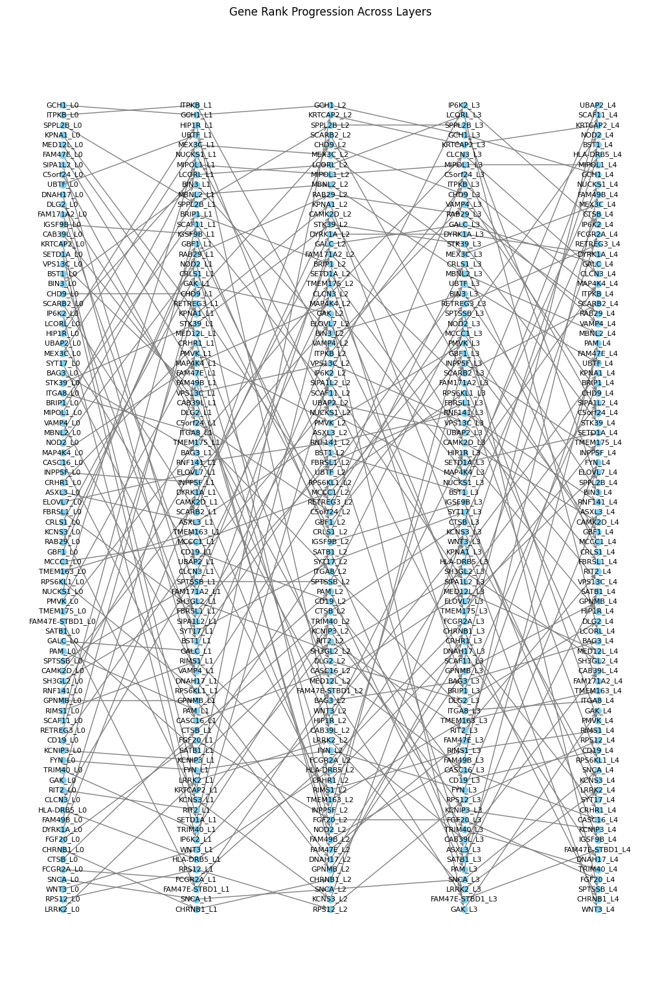

In [ ]:
import matplotlib.pyplot as plt
import networkx as nx

# The rank positions for each gene across four layers
gene_ranks = rank_dict

G = nx.DiGraph()

# Number of layers
num_layers = len(next(iter(gene_ranks.values())))

# Add nodes and edges for each gene across the layers
for gene, ranks in gene_ranks.items():
    for layer in range(num_layers - 1):
        # Add nodes for the gene at each layer with unique identifiers
        current_node = f"{gene}_L{layer}"
        next_node = f"{gene}_L{layer + 1}"
        G.add_node(current_node, layer=layer, rank=ranks[layer])
        G.add_node(next_node, layer=layer + 1, rank=ranks[layer + 1])
        
        # Add a directed edge to show rank progression between layers
        G.add_edge(current_node, next_node)

# Position nodes to show each layer vertically
pos = {}
layer_spacing = 1.5  # Space between layers
rank_spacing = 0.3   # Space between ranks in a layer

for node, data in G.nodes(data=True):
    layer = data['layer']
    rank = data['rank']
    pos[node] = (layer * layer_spacing, -rank * rank_spacing)

# Draw the graph
plt.figure(figsize=(10, 15))
nx.draw(G, pos, with_labels=True, node_size=50, font_size=8, arrowstyle='->', arrowsize=10, node_color="skyblue", edge_color="gray")

plt.title("Gene Rank Progression Across Layers")
plt.xlabel("Layers")
plt.ylabel("Rank (Higher is lower on graph)")
plt.gca().invert_yaxis()  # To have higher ranks visually lower
plt.show()

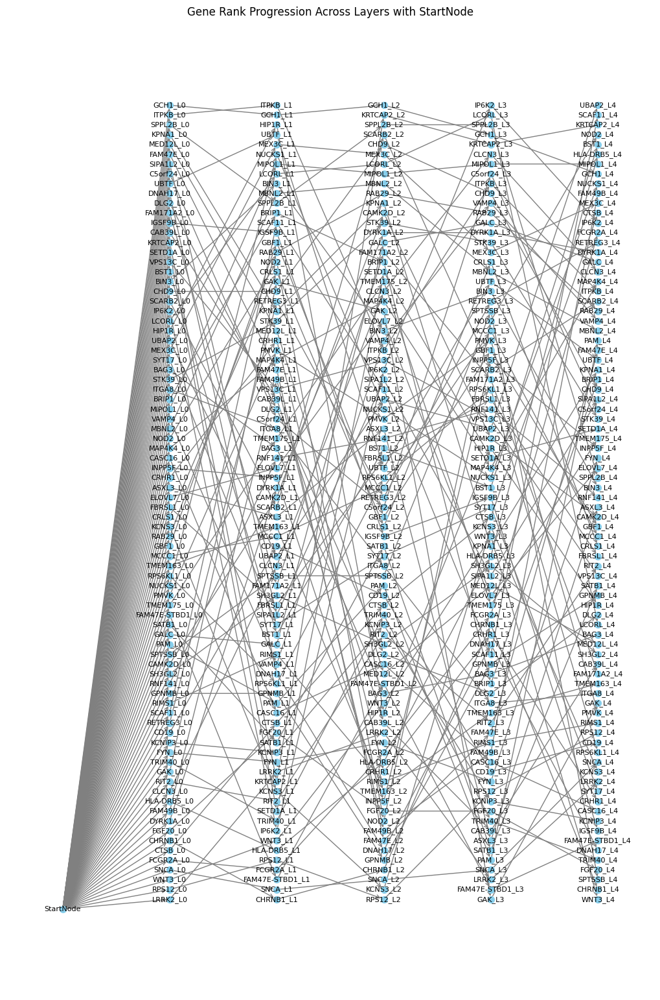

In [ ]:
import matplotlib.pyplot as plt
import networkx as nx

# Example rank dictionary (you should replace this with your actual rank_dict)

# Create the directed graph
G = nx.DiGraph()

# Number of layers (based on the length of the rank list)
num_layers = len(next(iter(rank_dict.values())))

# Add the start node before the first layer
start_node = "StartNode"
G.add_node(start_node, layer=-1, rank=0)  # Layer -1 to indicate it's before the first layer

# Add nodes and edges for each gene across the layers
for gene, ranks in rank_dict.items():
    for layer in range(num_layers - 1):
        # Add nodes for the gene at each layer with unique identifiers
        current_node = f"{gene}_L{layer}"
        next_node = f"{gene}_L{layer + 1}"
        G.add_node(current_node, layer=layer, rank=ranks[layer])
        G.add_node(next_node, layer=layer + 1, rank=ranks[layer + 1])
        
        # Add a directed edge to show rank progression between layers
        G.add_edge(current_node, next_node)
    
    # Add edges from the start node to the first layer nodes
    first_layer_node = f"{gene}_L0"
    G.add_edge(start_node, first_layer_node)

# Position nodes to show each layer vertically
pos = {}
layer_spacing = 1.5  # Space between layers
rank_spacing = 0.3   # Space between ranks in a layer

for node, data in G.nodes(data=True):
    layer = data['layer']
    rank = data['rank']
    pos[node] = (layer * layer_spacing, -rank * rank_spacing)

# Draw the graph
plt.figure(figsize=(10, 15))
nx.draw(G, pos, with_labels=True, node_size=50, font_size=8, arrowstyle='->', arrowsize=10, node_color="skyblue", edge_color="gray")

# Title and labels
plt.title("Gene Rank Progression Across Layers with StartNode")
plt.xlabel("Layers")
plt.ylabel("Rank (Higher is lower on graph)")
plt.gca().invert_yaxis()  # To have higher ranks visually lower
plt.savefig("gene_rank_progression.svg", format="svg")
plt.savefig("smaller_plots/smaller_gene_ranked_prgression_control_to_prodromal.png", dpi=100)

plt.show()


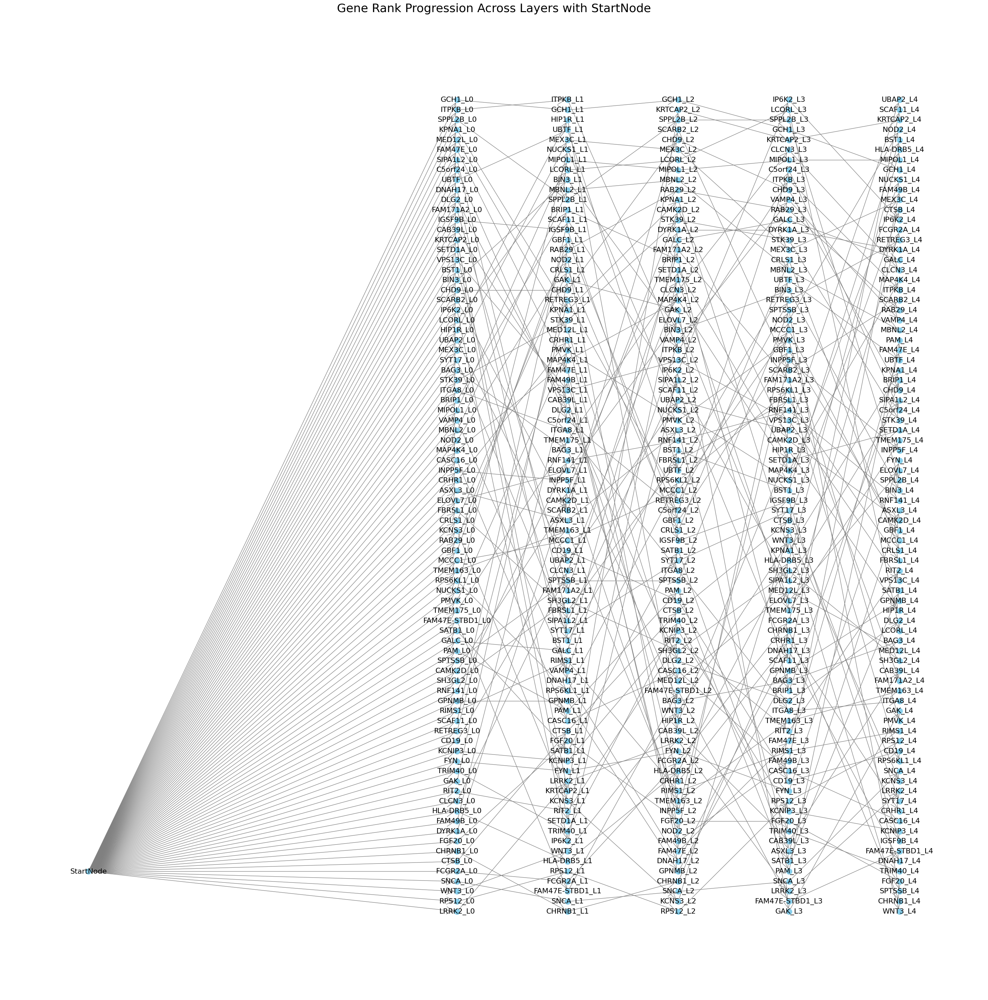

In [126]:
import matplotlib.pyplot as plt
import networkx as nx

# Example rank dictionary (you should replace this with your actual rank_dict)



# Create the directed graph
G = nx.DiGraph()

# Number of layers (based on the length of the rank list)
num_layers = len(next(iter(rank_dict.values())))

# Add the start node before the first layer
start_node = "StartNode"
G.add_node(start_node, layer=-1, rank=0)  # Layer -1 to indicate it's before the first layer

# Add nodes and edges for each gene across the layers
for gene, ranks in rank_dict.items():
    for layer in range(num_layers - 1):
        # Add nodes for the gene at each layer with unique identifiers
        current_node = f"{gene}_L{layer}"
        next_node = f"{gene}_L{layer + 1}"
        G.add_node(current_node, layer=layer, rank=ranks[layer])
        G.add_node(next_node, layer=layer + 1, rank=ranks[layer + 1])
        
        # Add a directed edge to show rank progression between layers
        G.add_edge(current_node, next_node)
    
    # Add edges from the start node to the first layer nodes
    first_layer_node = f"{gene}_L0"
    G.add_edge(start_node, first_layer_node)

# Position nodes to show each layer vertically
pos = {}
layer_spacing = 1.5  # Space between layers
rank_spacing = 0.3   # Space between ranks in a layer

# Set the position of the StartNode to be at the mid-left of the first layer
start_node_x_pos = -5 # Fixed position on the left
start_node_y_pos = -1.5  # Middle of first layer vertically

# Position the nodes
for node, data in G.nodes(data=True):
    layer = data['layer']
    rank = data['rank']
    
    if layer == -1:
        # Place the StartNode on the mid-left of the first layer
        pos[node] = (start_node_x_pos, start_node_y_pos)
    else:
        # Place other nodes based on their layer and rank
        pos[node] = (layer * layer_spacing, -rank * rank_spacing)

# Draw the graph
plt.figure(figsize=(30, 30))
nx.draw(G, pos, with_labels=True, node_size=150, font_size=16, arrowstyle='->', arrowsize=40, node_color="skyblue", edge_color="gray")

# Title and labels
plt.title("Gene Rank Progression Across Layers with StartNode", fontsize=26)
plt.xlabel("Layers")
plt.ylabel("Rank (Higher is lower on graph)")
plt.gca().invert_yaxis()  # To have higher ranks visually lower

# Save the plot as an SVG file
plt.savefig("gene_rank_progression_with_start_node_left.svg", format="svg")
plt.savefig("gene_rank_progression_with_start_node_left.png", format="png")
# Show the plot
plt.show()


In [127]:
!mkdir -p feature_importance_weights/lancet_genes/control_vs_prodromal

def return_value(i):

    l = [AVG_FEATURE_IMPORTANCES_Prodromal_BL_Control_BL[i],AVG_FEATURE_IMPORTANCES_Prodromal_V02_Control_V02[i],
         AVG_FEATURE_IMPORTANCES_Prodromal_V04_Control_V04[i],
    AVG_FEATURE_IMPORTANCES_Prodromal_V06_Control_V06[i],AVG_FEATURE_IMPORTANCES_Prodromal_V08_Control_V08[i]]
    return l


li = []
genes = []
for i in AVG_FEATURE_IMPORTANCES_Prodromal_BL_Control_BL.keys():
    
    li.append(return_value(i))
    genes.append(i)

df = pd.DataFrame(li)
df['genes'] = genes
df = df.set_index('genes')
df.columns = ['BL','V02','V04','V06','V08']
df['Gene_Name'] =df.reset_index()['genes'].apply(return_gene_name).tolist()
df = df.set_index('Gene_Name')
df.to_csv(f'feature_importance_weights/lancet_genes/control_vs_prodromal/control_vs_prodromal.csv',index = True)
df


,BL,V02,V04,V06,V08
Gene_Name,,,,,
INPP5F,-0.180937,-0.119861,0.013836,0.112968,-0.037221
HIP1R,-0.275133,0.618103,0.027586,0.082305,0.014510
BIN3,0.304422,0.499884,0.216611,0.199481,0.028610
CASC16,0.181449,0.060804,0.031838,0.011260,0.001828
GPNMB,-0.069229,-0.065370,-0.005599,0.020790,-0.015734
...,...,...,...,...,...
IP6K2,0.293797,-0.021161,0.146599,0.554633,0.099156
MIPOL1,-0.202503,-0.552095,-0.421201,-0.369628,-0.118730
RPS12,-0.000758,-0.014117,-0.001611,0.008953,-0.005169
